In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Step 2: Import necessary libraries
import pandas as pd
import os

In [ ]:
# Step 3: Define the paths to your CSV and images
csv_path = '/content/drive/MyDrive/6 Months Project/train.csv'  # Update with your actual path
images_folder_path = '/content/drive/MyDrive/6 Months Project/train'  # Update with your actual path

# Step 4: Load the train.csv file
train_df = pd.read_csv(csv_path)

# Step 5: Verify the data structure
print(train_df.head())

# Step 6: Add image paths to the DataFrame
def get_image_path(image_name):
    return os.path.join(images_folder_path, f'{image_name}.jpg')  # Assuming images are in .jpg format

train_df['image_path'] = train_df['image_name'].apply(get_image_path)

# Step 7: Verify that image paths are correctly added
print(train_df.head())

# Save the updated DataFrame to a new CSV file (optional)
train_df.to_csv('/content/drive/My Drive/updated_train.csv', index=False)

     image_name  patient_id     sex  age_approx anatom_site_general_challenge  \
0  ISIC_2637011  IP_7279968    male        45.0                     head/neck   
1  ISIC_0015719  IP_3075186  female        45.0               upper extremity   
2  ISIC_0052212  IP_2842074  female        50.0               lower extremity   
3  ISIC_0068279  IP_6890425  female        45.0                     head/neck   
4  ISIC_0074268  IP_8723313  female        55.0               upper extremity   

  diagnosis benign_malignant  target  
0   unknown           benign       0  
1   unknown           benign       0  
2     nevus           benign       0  
3   unknown           benign       0  
4   unknown           benign       0  
     image_name  patient_id     sex  age_approx anatom_site_general_challenge  \
0  ISIC_2637011  IP_7279968    male        45.0                     head/neck   
1  ISIC_0015719  IP_3075186  female        45.0               upper extremity   
2  ISIC_0052212  IP_2842074  female 

Class counts:
target
0    32542
1      584
Name: count, dtype: int64

Class percentages:
target
0    98.237034
1     1.762966
Name: proportion, dtype: float64


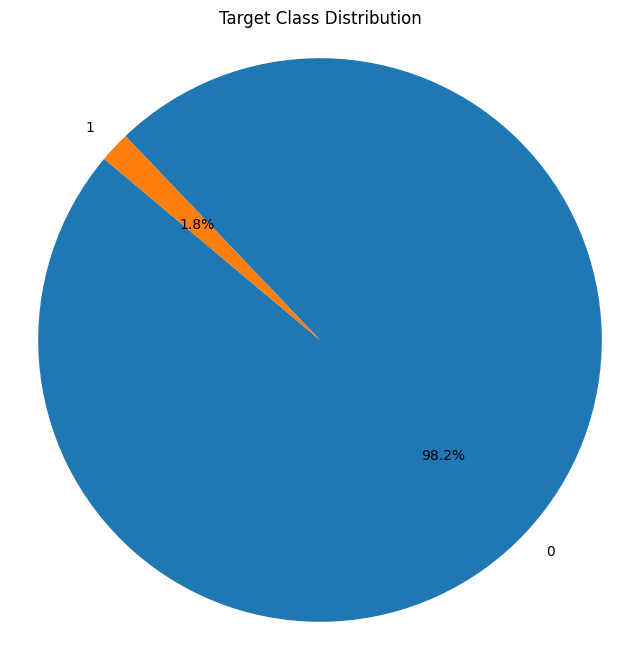

In [ ]:
import matplotlib.pyplot as plt

# Check for target class imbalance
class_counts = train_df['target'].value_counts()
print("Class counts:")
print(class_counts)

# Calculate the percentage of each class
class_percentages = train_df['target'].value_counts(normalize=True) * 100
print("\nClass percentages:")
print(class_percentages)

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Target Class Distribution')
plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 33%|███▎      | 2/6 [00:08<00:17,  4.32s/it]


New class counts:
target
1    32720
0    32542
Name: count, dtype: int64

New class percentages:
target
1    50.136373
0    49.863627
Name: proportion, dtype: float64


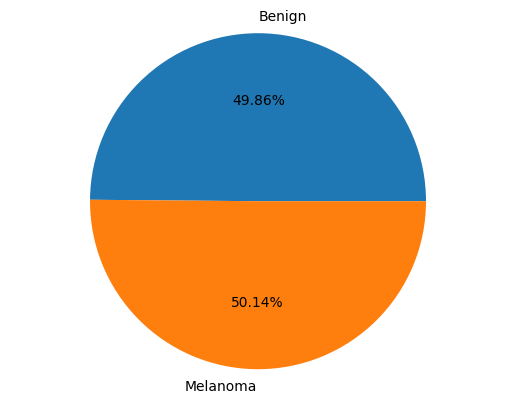

In [ ]:
''' from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
import os
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa

# Global settings
SEED = 42
DIM = 224
AUGMENTATION = True

# Load dataset
csv_path = '/content/drive/MyDrive/6 Months Project/train.csv'
images_folder_path = '/content/drive/MyDrive/6 Months Project/train'
train_df = pd.read_csv(csv_path)

# Add image paths to DataFrame
def get_image_path(image_name):
    return os.path.join(images_folder_path, f'{image_name}.jpg')

train_df['image_path'] = train_df['image_name'].apply(get_image_path)

# Function to load and preprocess images
def load_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (DIM, DIM))
    return image

# Separate melanoma images and labels
melanoma_df = train_df[train_df['target'] == 1]
melanoma_images_paths = melanoma_df['image_path'].tolist()
melanoma_labels = melanoma_df['target'].tolist()

# Define augmentation sequence
seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Crop(percent=(0, 0.1)),
    iaa.LinearContrast((0.75, 1.5)),
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    iaa.Affine(
        scale={'x': (0.8, 1.2), 'y': (0.8, 1.2)},
        translate_percent={'x': (-0.2, 0.2), 'y': (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True)

# Create directory for augmented images
augmented_images_folder = '/content/drive/MyDrive/6 Months Project/augmented_images_v2'
os.makedirs(augmented_images_folder, exist_ok=True)

# Augment melanoma images in batches and save them
batch_size = 100
target_count = 32542
current_count = len(melanoma_images_paths)
augmented_image_paths = []

def augment_and_save_images(batch_paths, seq, start_index):
    augmented_images = []
    for img_path in batch_paths:
        if os.path.exists(img_path):
            image = load_image(img_path)
            augmented_images.append(seq(image=image))
            augmented_images.append(seq(image=image))
    augmented_images = np.array(augmented_images, dtype=np.float32)

    batch_image_paths = []
    for i, img in enumerate(augmented_images):
        img_name = f'augmented_image_v2_{start_index + i}.jpg'
        img_path = os.path.join(augmented_images_folder, img_name)
        cv2.imwrite(img_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        batch_image_paths.append(img_path)

    return batch_image_paths

start_index = 0
while current_count < target_count:
    for batch_start in tqdm(range(0, len(melanoma_images_paths), batch_size)):
        batch_paths = melanoma_images_paths[batch_start:batch_start + batch_size]
        batch_augmented_paths = augment_and_save_images(batch_paths, seq, start_index)
        augmented_image_paths.extend(batch_augmented_paths)
        start_index += len(batch_augmented_paths)
        current_count += len(batch_augmented_paths)
        if current_count >= target_count:
            break

# Create DataFrame for augmented images
augmented_df = pd.DataFrame({
    'image_name': [os.path.splitext(os.path.basename(p))[0] for p in augmented_image_paths],
    'patient_id': [None] * len(augmented_image_paths),
    'sex': [None] * len(augmented_image_paths),
    'age_approx': [None] * len(augmented_image_paths),
    'anatom_site_general_challenge': [None] * len(augmented_image_paths),
    'diagnosis': [None] * len(augmented_image_paths),
    'benign_malignant': ['malignant'] * len(augmented_image_paths),
    'target': [1] * len(augmented_image_paths),
    'image_path': augmented_image_paths
})

# Combine the original and augmented DataFrame
balanced_df = pd.concat([train_df, augmented_df], ignore_index=True)

# Save the balanced dataset
balanced_df.to_csv('/content/drive/MyDrive/balanced_train_v2.csv', index=False)

# Verify the new class distribution
class_counts = balanced_df['target'].value_counts()
print("New class counts:")
print(class_counts)

class_percentages = balanced_df['target'].value_counts(normalize=True) * 100
print("\nNew class percentages:")
print(class_percentages)

if AUGMENTATION:
    _, count = np.unique(balanced_df['target'], return_counts=True)
    plt.pie(count, explode=(0, 0), labels=['Benign', 'Melanoma'], autopct="%1.2f%%")
    plt.axis('equal')
    plt.show() '''

In [ ]:
'''import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

# Define paths
augmented_images_folder = '/content/drive/MyDrive/6 Months Project/augmented_images_v2'
balanced_csv_path = '/content/drive/MyDrive/balanced_train_v2.csv'
output_folder = '/content/drive/MyDrive/6 Months Project/subfolders'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Load the balanced CSV
balanced_df = pd.read_csv(balanced_csv_path)

# Shuffle the dataframe
balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)

# Create subfolders with 14k images each (7k per class)
images_per_class = 7000
subfolder_size = 14000
subfolder_counter = 1
class_0_counter = 0
class_1_counter = 0

current_subfolder_images = []
current_subfolder_labels = []

for index, row in balanced_df.iterrows():
    img_path = row['image_path']
    target = row['target']

    # Check if we need to create a new subfolder
    if len(current_subfolder_images) >= subfolder_size:
        subfolder_path = os.path.join(output_folder, f'subfolder_{subfolder_counter}')
        os.makedirs(subfolder_path, exist_ok=True)

        # Save images and CSV
        subfolder_df = pd.DataFrame(current_subfolder_labels, columns=['image_path', 'target'])
        subfolder_df.to_csv(os.path.join(subfolder_path, 'balanced_train.csv'), index=False)

        for img in current_subfolder_images:
            shutil.move(img, os.path.join(subfolder_path, os.path.basename(img)))

        # Reset for the next subfolder
        subfolder_counter += 1
        current_subfolder_images = []
        current_subfolder_labels = []

    if (target == 0 and class_0_counter < images_per_class) or (target == 1 and class_1_counter < images_per_class):
        current_subfolder_images.append(img_path)
        current_subfolder_labels.append(row)

        if target == 0:
            class_0_counter += 1
        else:
            class_1_counter += 1

# Process any remaining images
if len(current_subfolder_images) > 0:
    subfolder_path = os.path.join(output_folder, f'subfolder_{subfolder_counter}')
    os.makedirs(subfolder_path, exist_ok=True)

    subfolder_df = pd.DataFrame(current_subfolder_labels, columns=['image_path', 'target'])
    subfolder_df.to_csv(os.path.join(subfolder_path, 'balanced_train.csv'), index=False)

    for img in current_subfolder_images:
        shutil.move(img, os.path.join(subfolder_path, os.path.basename(img)))
'''

In [ ]:
'''import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

# Define paths
augmented_images_folder = '/content/drive/MyDrive/6 Months Project/augmented_images_v2'
balanced_csv_path = '/content/drive/MyDrive/balanced_train_v2.csv'
output_folder = '/content/drive/MyDrive/6 Months Project/subfolders'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Load the balanced CSV
balanced_df = pd.read_csv(balanced_csv_path)

# Shuffle the dataframe
balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)

# Create subfolders with 14k images each (7k per class)
images_per_class = 7000
subfolder_size = 14000
subfolder_counter = 2  # Start from subfolder_2
class_0_counter = 0
class_1_counter = 0

current_subfolder_images = []
current_subfolder_labels = []

for index, row in balanced_df.iterrows():
    img_path = row['image_path']
    target = row['target']

    if (target == 0 and class_0_counter < images_per_class) or (target == 1 and class_1_counter < images_per_class):
        current_subfolder_images.append(img_path)
        current_subfolder_labels.append(row)

        if target == 0:
            class_0_counter += 1
        else:
            class_1_counter += 1

    # Check if we need to create a new subfolder
    if len(current_subfolder_images) >= subfolder_size:
        subfolder_path = os.path.join(output_folder, f'subfolder_{subfolder_counter}')
        os.makedirs(subfolder_path, exist_ok=True)

        # Save images and CSV
        subfolder_df = pd.DataFrame(current_subfolder_labels, columns=['image_path', 'target'])
        subfolder_df.to_csv(os.path.join(subfolder_path, 'balanced_train.csv'), index=False)

        for img in current_subfolder_images:
            try:
                shutil.move(img, os.path.join(subfolder_path, os.path.basename(img)))
            except FileNotFoundError:
                print(f"File not found and skipped: {img}")

        # Print the distribution of the current subfolder
        print(f'Distribution in subfolder_{subfolder_counter}:')
        print(subfolder_df['target'].value_counts(normalize=True) * 100)

        # Reset for the next subfolder
        subfolder_counter += 1
        class_0_counter = 0
        class_1_counter = 0
        current_subfolder_images = []
        current_subfolder_labels = []

# Process any remaining images
if len(current_subfolder_images) > 0:
    subfolder_path = os.path.join(output_folder, f'subfolder_{subfolder_counter}')
    os.makedirs(subfolder_path, exist_ok=True)

    subfolder_df = pd.DataFrame(current_subfolder_labels, columns=['image_path', 'target'])
    subfolder_df.to_csv(os.path.join(subfolder_path, 'balanced_train.csv'), index=False)

    for img in current_subfolder_images:
        try:
            shutil.move(img, os.path.join(subfolder_path, os.path.basename(img)))
        except FileNotFoundError:
            print(f"File not found and skipped: {img}")

    # Print the distribution of the current subfolder
    print(f'Distribution in subfolder_{subfolder_counter}:')
    print(subfolder_df['target'].value_counts(normalize=True) * 100)
'''

Streaming output truncated to the last 5000 lines.
File not found and skipped: /content/drive/MyDrive/6 Months Project/augmented_images_v2/augmented_image_v2_1901.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_8307332.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_8050538.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_1300967.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_1158816.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_3526017.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_6968422.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_4954282.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_1164824.jpg
File not found and skipped: /content/drive/MyDrive/6 Months Project/train/ISIC_1450315.jpg
File not found

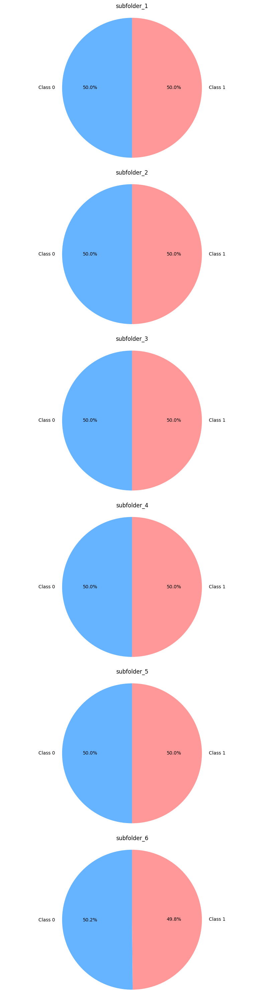

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define paths
output_folder = '/content/drive/MyDrive/6 Months Project/subfolders'

# Get list of subfolders
subfolders = [f for f in os.listdir(output_folder) if os.path.isdir(os.path.join(output_folder, f))]

subfolder_summaries = []

for subfolder in subfolders:
    subfolder_path = os.path.join(output_folder, subfolder)
    csv_path = os.path.join(subfolder_path, 'balanced_train.csv')

    if os.path.exists(csv_path):
        subfolder_df = pd.read_csv(csv_path)
        class_counts = subfolder_df['target'].value_counts()
        class_percentages = subfolder_df['target'].value_counts(normalize=True) * 100

        subfolder_summary = {
            'subfolder': subfolder,
            'total_images': len(subfolder_df),
            'class_0_count': class_counts.get(0, 0),
            'class_1_count': class_counts.get(1, 0),
            'class_0_percentage': class_percentages.get(0, 0),
            'class_1_percentage': class_percentages.get(1, 0)
        }
        subfolder_summaries.append(subfolder_summary)

# Convert summaries to DataFrame
summary_df = pd.DataFrame(subfolder_summaries)

# Plot class distributions vertically
num_plots = len(subfolders)
fig, axes = plt.subplots(num_plots, 1, figsize=(8, 5 * num_plots))

for ax, subfolder_summary in zip(axes, subfolder_summaries):
    labels = ['Class 0', 'Class 1']
    sizes = [subfolder_summary['class_0_percentage'], subfolder_summary['class_1_percentage']]
    ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff','#ff9999'])
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    ax.set_title(subfolder_summary['subfolder'])

plt.tight_layout()
plt.show()


In [ ]:
import os
import pandas as pd

# Define paths
output_folder = '/content/drive/MyDrive/6 Months Project/subfolders'

# Get list of subfolders
subfolders = [f for f in os.listdir(output_folder) if os.path.isdir(os.path.join(output_folder, f))]

for subfolder in subfolders:
    subfolder_path = os.path.join(output_folder, subfolder)
    csv_path = os.path.join(subfolder_path, 'balanced_train.csv')

    if os.path.exists(csv_path):
        subfolder_df = pd.read_csv(csv_path)
        num_images = len(os.listdir(subfolder_path)) - 1  # Subtract 1 for the CSV file

        print(f"Subfolder: {subfolder}")
        print(f"Number of images in folder: {num_images}")
        print(f"Number of rows in CSV: {len(subfolder_df)}")
        print()


Subfolder: subfolder_1
Number of images in folder: 14000
Number of rows in CSV: 14000

Subfolder: subfolder_2
Number of images in folder: 11058
Number of rows in CSV: 14000

Subfolder: subfolder_3
Number of images in folder: 10990
Number of rows in CSV: 14000

Subfolder: subfolder_4
Number of images in folder: 11018
Number of rows in CSV: 14000

Subfolder: subfolder_5
Number of images in folder: 10944
Number of rows in CSV: 14000

Subfolder: subfolder_6
Number of images in folder: 6854
Number of rows in CSV: 8758



In [ ]:
import os
import pandas as pd

# Define the paths to the CSV files
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Function to validate image paths
def validate_image_paths(csv_path):
    # Read the CSV file
    df = pd.read_csv(csv_path)

    # List to store missing images
    missing_images = []

    # Check for each image path in the CSV
    for image_path in df['image_path']:
        if not os.path.exists(image_path):
            missing_images.append(image_path)

    return missing_images

# Validate the image paths in the training and validation CSV files
missing_train_images = validate_image_paths(train_csv_path)
missing_validation_images = validate_image_paths(validation_csv_path)

# Report results
if not missing_train_images and not missing_validation_images:
    print("All images referenced in the CSV files are present.")
else:
    if missing_train_images:
        print("Missing training images:")
        for img in missing_train_images:
            print(img)
    if missing_validation_images:
        print("Missing validation images:")
        for img in missing_validation_images:
            print(img)


All images referenced in the CSV files are present.


In [ ]:
import pandas as pd
df= pd.read_csv('/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv')
df.sample(5)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,image_path
10686,ISIC_1730202,IP_10687,male,65.0,torso,unknown,benign,0,/content/drive/MyDrive/SIIMS Melanoma/train/IS...
4402,augmented_image_v2_19132,IP_4403,male,45.0,oral/genital,lentigo NOS,malignant,1,/content/drive/MyDrive/SIIMS Melanoma/augmente...
8459,ISIC_6782271,IP_8460,female,35.0,upper extremity,unknown,benign,0,/content/drive/MyDrive/SIIMS Melanoma/train/IS...
2367,ISIC_4452285,IP_2368,male,60.0,lower extremity,nevus,benign,0,/content/drive/MyDrive/SIIMS Melanoma/train/IS...
10149,augmented_image_v2_29061,IP_10150,male,54.0,oral/genital,lentigo NOS,malignant,1,/content/drive/MyDrive/SIIMS Melanoma/augmente...


Model Building and Training After Dividing the Subfolders in the Local System Successfully

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Define paths
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Load data
train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Extract metadata and labels
metadata_features = ['sex', 'age_approx', 'anatom_site_general_challenge', 'diagnosis']
train_metadata = train_df[metadata_features]
validation_metadata = validation_df[metadata_features]

# Convert categorical features to numerical
train_metadata.loc[:, 'sex'] = train_metadata['sex'].map({'male': 0, 'female': 1})
validation_metadata.loc[:, 'sex'] = validation_metadata['sex'].map({'male': 0, 'female': 1})
train_metadata = pd.get_dummies(train_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])
validation_metadata = pd.get_dummies(validation_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])

# Align columns in train and validation sets (handle missing columns after get_dummies)
train_metadata, validation_metadata = train_metadata.align(validation_metadata, join='outer', axis=1, fill_value=0)

# Convert metadata to float32
train_metadata = train_metadata.astype(np.float32)
validation_metadata = validation_metadata.astype(np.float32)

# Convert labels to float32
train_labels = train_df['target'].astype(np.float32).values
validation_labels = validation_df['target'].astype(np.float32).values

# Image data generators
train_datagen = ImageDataGenerator(rescale=0.255)
validation_datagen = ImageDataGenerator(rescale=0.255)

# Function to create data generators
def create_generator(datagen, df, metadata, labels):
    def generator():
        for img_path, meta, label in zip(df['image_path'], metadata.values, labels):
            img = Image.open(img_path)
            img = img.resize((224, 224))
            img_array = img_to_array(img)
            img_array = datagen.random_transform(img_array)
            yield ({'image': img_array, 'metadata': meta}, label)
    return generator

train_generator = tf.data.Dataset.from_generator(
    create_generator(train_datagen, train_df, train_metadata, train_labels),
    output_signature=(
        {'image': tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         'metadata': tf.TensorSpec(shape=(train_metadata.shape[1],), dtype=tf.float32)},
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

validation_generator = tf.data.Dataset.from_generator(
    create_generator(validation_datagen, validation_df, validation_metadata, validation_labels),
    output_signature=(
        {'image': tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         'metadata': tf.TensorSpec(shape=(validation_metadata.shape[1],), dtype=tf.float32)},
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

# Define model
inp_image = Input(name='image', shape=(224, 224, 3))
inp_metadata = Input(name='metadata', shape=(train_metadata.shape[1],))

def inception_block(x, base_channels=16):
    conv_1 = Conv2D(base_channels * 2, 1, 1, activation='relu')(x)
    conv_2_a = Conv2D(base_channels * 2, 1, 1, activation='relu')(x)
    conv_2_b = Conv2D(base_channels * 2, 3, 1, padding='same', activation='relu')(conv_2_a)
    conv_3_a = Conv2D(base_channels, 1, 1, activation='relu')(x)
    conv_3_b = Conv2D(base_channels, 5, 1, padding='same', activation='relu')(conv_3_a)
    mpool_4_a = MaxPooling2D(3, 1, padding='same')(x)
    conv_4_b = Conv2D(base_channels, 1, 1, activation='relu')(mpool_4_a)
    return Concatenate(axis=-1)([conv_1, conv_2_b, conv_3_b, conv_4_b])

block_1 = inception_block(inp_image)
#block_2 = inception_block(block_1, base_channels=8)
#block_3 = inception_block(block_2, base_channels=8)

gap = GlobalAveragePooling2D()(block_1)
flatn = Flatten()(gap)

# Metadata branch
metadata_dense = Dense(32, activation='relu')(inp_metadata)
metadata_output = Dense(16, activation='relu')(metadata_dense)

# Concatenate image and metadata branches
concat = Concatenate(axis=-1)([flatn, metadata_output])
output = Dense(1, activation="sigmoid")(concat)

model = Model(inputs=[inp_image, inp_metadata], outputs=output)

# Print model summary
model.summary()

# Compile model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
model_checkpoint = ModelCheckpoint("/content/drive/MyDrive/SIIMS Melanoma/best_model.h5",
                                   monitor='val_loss', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

# Save the model
model.save("/content/drive/MyDrive/SIIMS Melanoma/exp_model.h5")



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 image (InputLayer)          [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 224, 224, 32)         128       ['image[0][0]']               
                                                                                                  
 conv2d_9 (Conv2D)           (None, 224, 224, 16)         64        ['image[0][0]']               
                                                                                                  
 max_pooling2d_1 (MaxPoolin  (None, 224, 224, 3)          0         ['image[0][0]']               
 g2D)                                                                                       

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


350/350 [==============================] - 3337s 10s/step - loss: 0.0867 - accuracy: 0.9754 - val_loss: 0.6420 - val_accuracy: 0.7950 - lr: 0.0010
Epoch 3/10
350/350 [==============================] - 3391s 10s/step - loss: 0.0247 - accuracy: 0.9934 - val_loss: 1.0567 - val_accuracy: 0.7211 - lr: 0.0010
Epoch 4/10
350/350 [==============================] - 3378s 10s/step - loss: 0.0114 - accuracy: 0.9971 - val_loss: 0.7744 - val_accuracy: 0.7643 - lr: 2.0000e-04


In [ ]:
# Save the model
model.save("/content/drive/MyDrive/SIIMS Melanoma/exp_model.keras")

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Define paths
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Load data
train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Extract metadata and labels
metadata_features = ['sex', 'age_approx', 'anatom_site_general_challenge', 'diagnosis']
train_metadata = train_df[metadata_features]
validation_metadata = validation_df[metadata_features]

# Convert categorical features to numerical
train_metadata.loc[:, 'sex'] = train_metadata['sex'].map({'male': 0, 'female': 1})
validation_metadata.loc[:, 'sex'] = validation_metadata['sex'].map({'male': 0, 'female': 1})
train_metadata = pd.get_dummies(train_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])
validation_metadata = pd.get_dummies(validation_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])

# Align columns in train and validation sets (handle missing columns after get_dummies)
train_metadata, validation_metadata = train_metadata.align(validation_metadata, join='outer', axis=1, fill_value=0)

# Convert metadata to float32
train_metadata = train_metadata.astype(np.float32)
validation_metadata = validation_metadata.astype(np.float32)

# Convert labels to float32
train_labels = train_df['target'].astype(np.float32).values
validation_labels = validation_df['target'].astype(np.float32).values

# Image data generators
train_datagen = ImageDataGenerator(rescale=0.255)
validation_datagen = ImageDataGenerator(rescale=0.255)

# Function to create data generators
def create_generator(datagen, df, metadata, labels):
    def generator():
        for img_path, meta, label in zip(df['image_path'], metadata.values, labels):
            img = Image.open(img_path)
            img = img.resize((224, 224))
            img_array = img_to_array(img)
            img_array = datagen.random_transform(img_array)
            yield ({'image': img_array, 'metadata': meta}, label)
    return generator

train_generator = tf.data.Dataset.from_generator(
    create_generator(train_datagen, train_df, train_metadata, train_labels),
    output_signature=(
        {'image': tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         'metadata': tf.TensorSpec(shape=(train_metadata.shape[1],), dtype=tf.float32)},
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

validation_generator = tf.data.Dataset.from_generator(
    create_generator(validation_datagen, validation_df, validation_metadata, validation_labels),
    output_signature=(
        {'image': tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         'metadata': tf.TensorSpec(shape=(validation_metadata.shape[1],), dtype=tf.float32)},
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

Training Set Images:
1/1 [==============================] - 0s 229ms/step


<ipython-input-25-7b8fd6a08d3b>:52: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


1/1 [==============================] - 0s 122ms/step


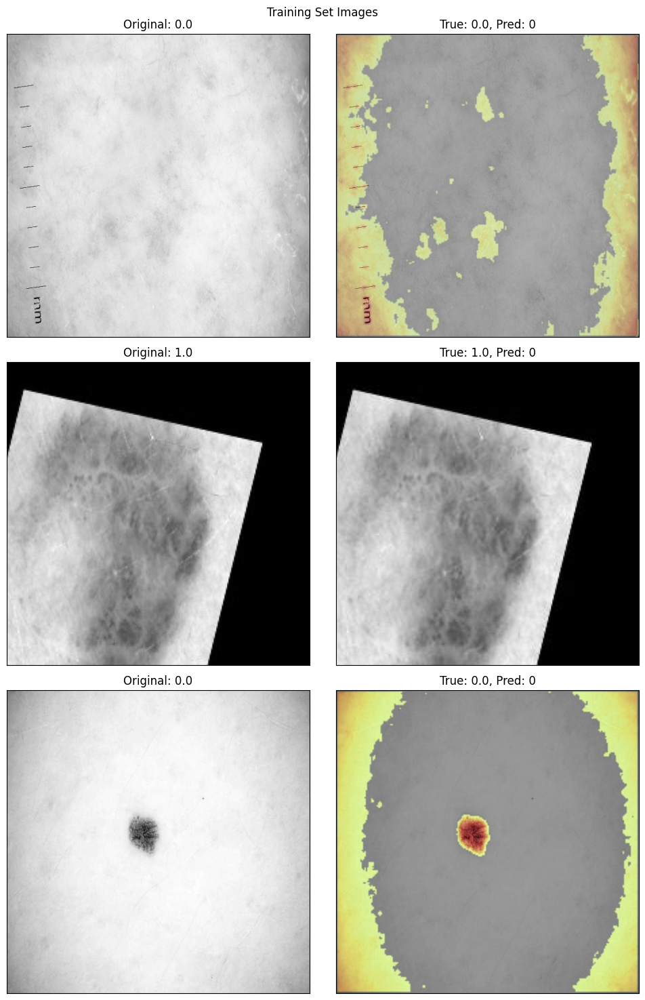

Validation Set Images:
1/1 [==============================] - 0s 84ms/step


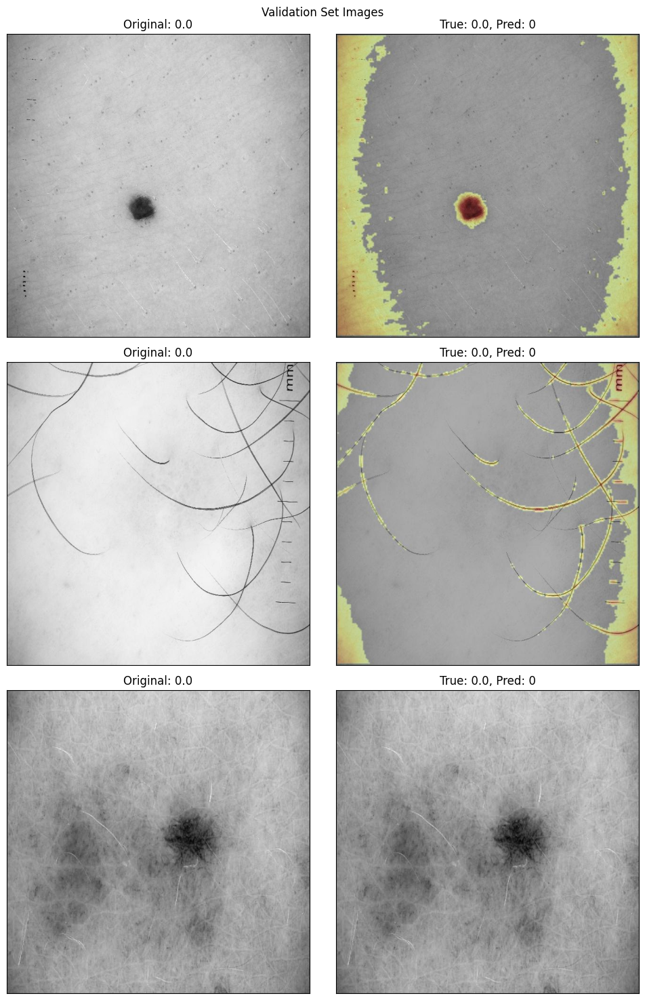

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model.keras"
model = load_model(model_path)

# Grad-CAM utility functions
def get_img_array(img_path, size):
    try:
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
        array = tf.keras.preprocessing.image.img_to_array(img)
        array = np.expand_dims(array, axis=0)
        return array
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        return None

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4, threshold=0.59):
    try:
        img = tf.keras.preprocessing.image.load_img(img_path)
        img = tf.keras.preprocessing.image.img_to_array(img)

        # Convert image to grayscale
        gray_img = np.dot(img[..., :3], [0.2989, 0.587, 0.114])
        gray_img = np.repeat(gray_img[:, :, np.newaxis], 3, axis=2)

        heatmap = np.uint8(255 * heatmap)

        jet = plt.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap]

        jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
        jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
        jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

        thresholded_heatmap = (heatmap > (255 * threshold)).astype(np.uint8)
        thresholded_heatmap = np.expand_dims(thresholded_heatmap, axis=-1)
        thresholded_heatmap = tf.image.resize(thresholded_heatmap, (img.shape[0], img.shape[1])).numpy()

        jet_heatmap = jet_heatmap * thresholded_heatmap

        superimposed_img = jet_heatmap * alpha + gray_img
        superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

        superimposed_img.save(cam_path)

        return cam_path
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        return None

# Process and display Grad-CAM for multiple images
def process_images(df, metadata, labels, num_images=3, title=''):
    preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

    fig, axes = plt.subplots(nrows=num_images, ncols=2, figsize=(10, 15), subplot_kw={'xticks': [], 'yticks': []})

    processed_images = 0

    for idx in range(len(df)):
        if processed_images >= num_images:
            break

        image_path = df['image_path'].iloc[idx]
        image = get_img_array(image_path, (224, 224))

        if image is None:
            continue

        image = preprocess_input(image)
        meta = metadata.iloc[idx].values.reshape(1, -1)
        true_label = labels[idx]

        # Predict the label
        prediction = model.predict([image, meta])
        predicted_label = np.argmax(prediction, axis=1)[0]

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap([image, meta], model, 'conv2d_8')

        # Save and display Grad-CAM heatmap
        cam_path = save_and_display_gradcam(image_path, heatmap, cam_path=f'cam_{idx}.jpg')

        if cam_path is None:
            continue

        # Plot original image and Grad-CAM heatmap side by side
        original_img = tf.keras.preprocessing.image.load_img(image_path)
        original_img = tf.keras.preprocessing.image.img_to_array(original_img)
        gray_img = np.dot(original_img[..., :3], [0.2989, 0.587, 0.114])
        axes[processed_images, 0].imshow(gray_img, cmap='gray')
        axes[processed_images, 0].set_title(f"Original: {true_label}")

        axes[processed_images, 1].imshow(plt.imread(cam_path))
        axes[processed_images, 1].set_title(f"True: {true_label}, Pred: {predicted_label}")

        processed_images += 1

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Process 3 images from the training set
print("Training Set Images:")
process_images(train_df, train_metadata, train_labels, num_images=3, title='Training Set Images')

# Process 3 images from the validation set
print("Validation Set Images:")
process_images(validation_df, validation_metadata, validation_labels, num_images=3, title='Validation Set Images')


1/1 [==============================] - 0s 411ms/step
Prediction: Malignant


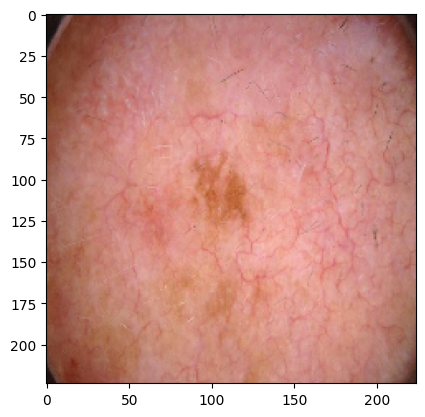

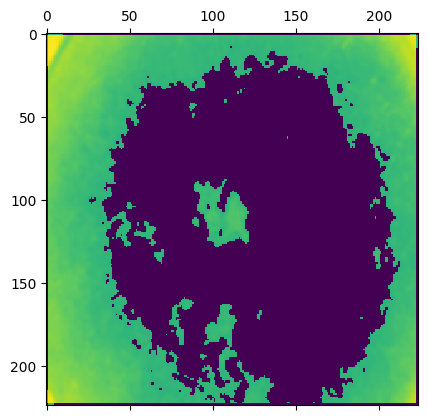

<ipython-input-60-56f6455aedd0>:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


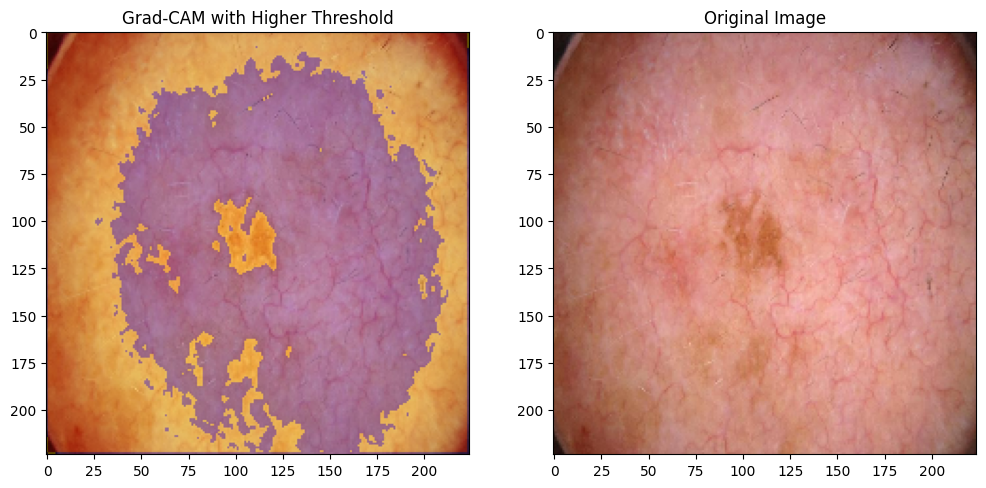

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Load the trained model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model.keras"
model = load_model(model_path)

# Image path
IMAGE_PATH = "/content/drive/MyDrive/SIIMS Melanoma/train/ISIC_3408231.jpg"

# Load and preprocess the image
img = tf.keras.preprocessing.image.load_img(IMAGE_PATH, target_size=(224, 224))
img = tf.keras.preprocessing.image.img_to_array(img) / 255
plt.imshow(img)
origin_img = img

# Get the prediction for the image from the model
prediction = model.predict([np.expand_dims(img, axis=0), np.expand_dims(np.zeros(15), axis=0)])
binary_prediction = [0 if x < 0.5 else 1 for x in prediction]
print("Prediction: " + ("Benign" if binary_prediction == 0 else "Malignant"))

# Create a model that maps the input image to the activations of the last conv layer as well as the output predictions
last_conv_layer_name = "conv2d_8"  # Adjust based on your model
grad_model = tf.keras.models.Model(
    [model.input],
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# Compute the gradient of the top predicted class for the input image
with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model([np.expand_dims(img, axis=0), np.expand_dims(np.zeros(15), axis=0)])
    class_channel = preds[:, np.argmax(preds[0])]

# Get the gradients
grads = tape.gradient(class_channel, last_conv_layer_output)

# Compute the guided gradients
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Weigh the output feature map by the gradients
last_conv_layer_output = last_conv_layer_output[0]
heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)

# Normalize the heatmap between 0 and 1
heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
heatmap = heatmap.numpy()

# Apply higher threshold
threshold = 0.65
heatmap[heatmap < threshold] = 0

# Display heatmap
plt.matshow(heatmap)
plt.show()

# Load the original image
o_img = tf.keras.preprocessing.image.load_img(IMAGE_PATH, target_size=(224, 224))
o_img = tf.keras.preprocessing.image.img_to_array(img) * 255

# Rescale heatmap to a range 0-255
heatmap = np.uint8(255 * heatmap)

# Use jet colormap to colorize heatmap
jet = cm.get_cmap("jet")

# Use RGB values of the colormap
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

# Create an image with RGB colorized heatmap
jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((224, 224))
jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

# Superimpose the heatmap on original image
superimposed_img = jet_heatmap * 0.4 + o_img
superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

# Plot the images
fig = plt.figure(figsize=(12, 8))

ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(superimposed_img)
ax1.set_title('Grad-CAM with Higher Threshold')

ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(origin_img)
ax2.set_title('Original Image')

plt.show()


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix
import shap

# Define paths
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Load data
train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Extract metadata and labels
metadata_features = ['sex', 'age_approx', 'anatom_site_general_challenge', 'diagnosis']
train_metadata = train_df[metadata_features]
validation_metadata = validation_df[metadata_features]

# Convert categorical features to numerical
train_metadata.loc[:, 'sex'] = train_metadata['sex'].map({'male': 0, 'female': 1})
validation_metadata.loc[:, 'sex'] = validation_metadata['sex'].map({'male': 0, 'female': 1})
train_metadata = pd.get_dummies(train_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])
validation_metadata = pd.get_dummies(validation_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])

# Align columns in train and validation sets (handle missing columns after get_dummies)
train_metadata, validation_metadata = train_metadata.align(validation_metadata, join='outer', axis=1, fill_value=0)

# Convert metadata to float32
train_metadata = train_metadata.astype(np.float32)
validation_metadata = validation_metadata.astype(np.float32)

# Convert labels to float32
train_labels = train_df['target'].astype(np.float32).values
validation_labels = validation_df['target'].astype(np.float32).values

# Image data generators
train_datagen = ImageDataGenerator(rescale=0.255)
validation_datagen = ImageDataGenerator(rescale=0.255)

# Function to create data generators
def create_image_generator(datagen, df, labels):
    def generator():
        for img_path, label in zip(df['image_path'], labels):
            img = Image.open(img_path)
            img = img.resize((224, 224))
            img_array = img_to_array(img)
            img_array = datagen.random_transform(img_array)
            yield (img_array, label)
    return generator

train_image_generator = tf.data.Dataset.from_generator(
    create_image_generator(train_datagen, train_df, train_labels),
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

validation_image_generator = tf.data.Dataset.from_generator(
    create_image_generator(validation_datagen, validation_df, validation_labels),
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

# Define image model
inp_image = Input(name='image', shape=(224, 224, 3))
x = Conv2D(32, 3, activation='relu')(inp_image)
x = MaxPooling2D()(x)
x = Conv2D(64, 3, activation='relu')(x)
x = MaxPooling2D()(x)
x = Conv2D(128, 3, activation='relu')(x)
x = MaxPooling2D()(x)
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)  # Dropout layer to reduce overfitting
output_image = Dense(1, activation='sigmoid')(x)

image_model = Model(inputs=inp_image, outputs=output_image)

# Print image model summary
image_model.summary()

# Compile image model
optimizer_image = Adam(learning_rate=0.001)
image_model.compile(optimizer=optimizer_image, loss='binary_crossentropy', metrics=['accuracy'])

# Define callbacks for image model
early_stopping_image = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
model_checkpoint_image = ModelCheckpoint("/content/drive/MyDrive/SIIMS Melanoma/best_model_image.h5",
                                         monitor='val_loss', save_best_only=True)
reduce_lr_image = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# Train the image model
history_image = image_model.fit(
    train_image_generator,
    validation_data=validation_image_generator,
    epochs=10,
    callbacks=[early_stopping_image, model_checkpoint_image, reduce_lr_image]
)

# Save the image model
image_model.save("/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5")

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


350/350 [==============================] - 1378s 4s/step - loss: 0.1037 - accuracy: 0.9739 - val_loss: 0.0875 - val_accuracy: 0.9789 - lr: 0.0010
Epoch 3/10
350/350 [==============================] - 1354s 4s/step - loss: 0.0947 - accuracy: 0.9771 - val_loss: 0.0668 - val_accuracy: 0.9832 - lr: 0.0010
Epoch 4/10
350/350 [==============================] - 1336s 4s/step - loss: 0.0906 - accuracy: 0.9784 - val_loss: 0.0660 - val_accuracy: 0.9843 - lr: 0.0010
Epoch 5/10
350/350 [==============================] - 1322s 4s/step - loss: 0.0874 - accuracy: 0.9791 - val_loss: 0.0684 - val_accuracy: 0.9850 - lr: 0.0010
Epoch 6/10
350/350 [==============================] - 1358s 4s/step - loss: 0.0844 - accuracy: 0.9792 - val_loss: 0.0677 - val_accuracy: 0.9854 - lr: 0.0010
Epoch 7/10
350/350 [==============================] - 1337s 4s/step - loss: 0.0755 - accuracy: 0.9807 - val_loss: 0.0665 - val_accuracy: 0.9846 - lr: 2.0000e-04


In [ ]:
# Save the image model
image_model.save("/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.keras")

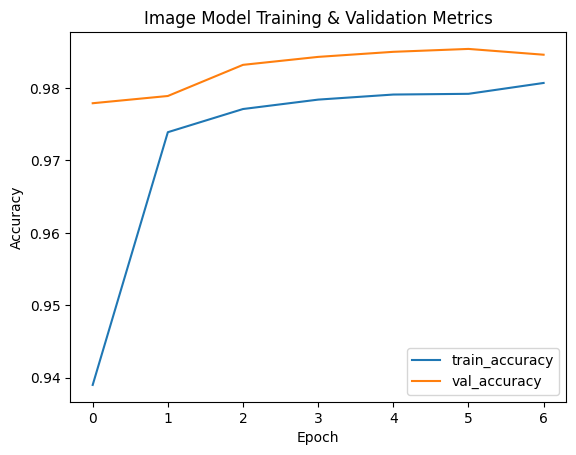

88/88 [==============================] - 1925s 21s/step
Confusion Matrix Image Model:
[[1399    1]
 [  43 1357]]


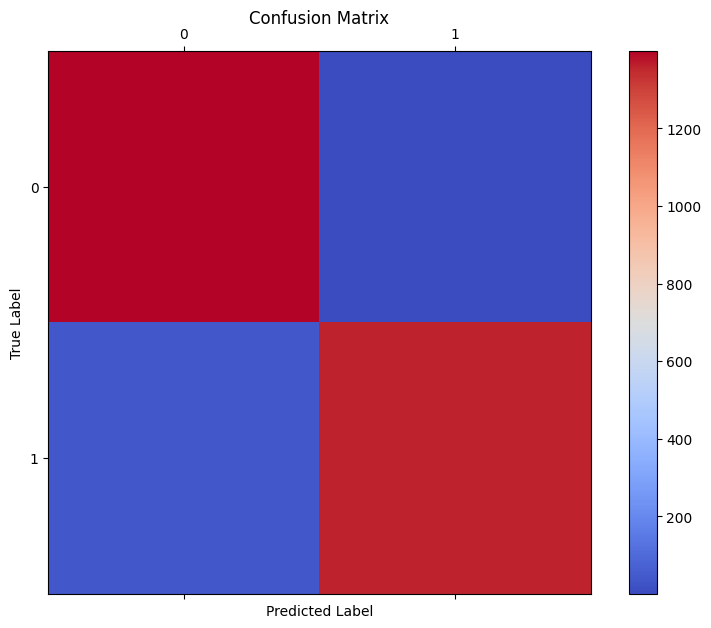

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix



# Define paths
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Load data
train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Extract metadata and labels
metadata_features = ['sex', 'age_approx', 'anatom_site_general_challenge', 'diagnosis']
train_metadata = train_df[metadata_features]
validation_metadata = validation_df[metadata_features]

# Convert categorical features to numerical
train_metadata.loc[:, 'sex'] = train_metadata['sex'].map({'male': 0, 'female': 1})
validation_metadata.loc[:, 'sex'] = validation_metadata['sex'].map({'male': 0, 'female': 1})
train_metadata = pd.get_dummies(train_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])
validation_metadata = pd.get_dummies(validation_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])

# Align columns in train and validation sets (handle missing columns after get_dummies)
train_metadata, validation_metadata = train_metadata.align(validation_metadata, join='outer', axis=1, fill_value=0)

# Convert metadata to float32
train_metadata = train_metadata.astype(np.float32)
validation_metadata = validation_metadata.astype(np.float32)

# Convert labels to float32
train_labels = train_df['target'].astype(np.float32).values
validation_labels = validation_df['target'].astype(np.float32).values

# Image data generators
validation_datagen = ImageDataGenerator(rescale=0.255)

# Function to create data generators
def create_image_generator(datagen, df, labels):
    def generator():
        for img_path, label in zip(df['image_path'], labels):
            img = Image.open(img_path)
            img = img.resize((224, 224))
            img_array = img_to_array(img)
            img_array = datagen.random_transform(img_array)
            yield (img_array, label)
    return generator

validation_image_generator = tf.data.Dataset.from_generator(
    create_image_generator(validation_datagen, validation_df, validation_labels),
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(32)

# Reload the image model
image_model = load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.keras")

# Plot model summary for image model
tf.keras.utils.plot_model(image_model, to_file="/content/drive/MyDrive/SIIMS Melanoma/image_model_summary.png", show_shapes=True)

# Assuming history object with manually filled data
history_image = {
    'train_accuracy': [0.9390, 0.9739, 0.9771, 0.9784, 0.9791, 0.9792, 0.9807],
    'val_accuracy': [0.9779, 0.9789, 0.9832, 0.9843, 0.9850, 0.9854, 0.9846],
    'loss': [0.2872, 0.1037, 0.0947, 0.0906, 0.0874, 0.0844, 0.0755],
    'val_loss': [0.0879, 0.0875, 0.0668, 0.0660, 0.0684, 0.0677, 0.0665],
}

# Plot training & validation metrics for image model
plt.plot(history_image['train_accuracy'], label='train_accuracy')
plt.plot(history_image['val_accuracy'], label='val_accuracy')
plt.title('Image Model Training & Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig("/content/drive/MyDrive/SIIMS Melanoma/image_model_metrics.png")
plt.show()

# Plot confusion matrix for image model
preds = (image_model.predict(validation_image_generator) > 0.5).astype("int32")
conf_matrix_image = confusion_matrix(validation_labels, preds)
print("Confusion Matrix Image Model:")
print(conf_matrix_image)

# Plotting confusion matrix
plt.figure(figsize=(10, 7))
plt.matshow(conf_matrix_image, cmap='coolwarm', fignum=1)
plt.title('Confusion Matrix', pad=20)
plt.colorbar()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.savefig("/content/drive/MyDrive/SIIMS Melanoma/image_model_confusion_matrix.png")
plt.show()


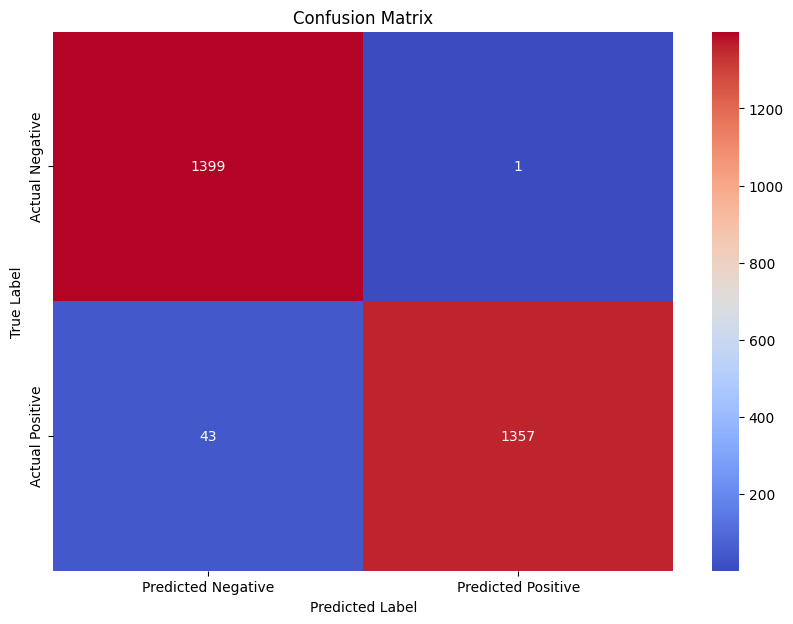

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Confusion matrix data
conf_matrix_image = np.array([[1399, 1], [43, 1357]])

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_image, annot=True, fmt='d', cmap='coolwarm', cbar=True,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.savefig("/content/drive/MyDrive/SIIMS Melanoma/image_model_confusion_matrix.png")
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
model = load_model(model_path)


In [ ]:
import cv2
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Rescaling as in training
    return img_array

# Example image path from your dataset
img_path = "/content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_24967.jpg"
preprocessed_image = preprocess_image(img_path)


In [ ]:
import tensorflow as tf
import numpy as np

# Function to compute Grad-CAM
def get_grad_cam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap

# Generate Grad-CAM heatmap
last_conv_layer_name = 'conv2d_2'  # Last convolutional layer in your model
heatmap = get_grad_cam(model, preprocessed_image, last_conv_layer_name)


In [ ]:
def apply_colormap(heatmap, original_img_path):
    img = cv2.imread(original_img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

# Apply colormap to heatmap
colored_heatmap = apply_colormap(heatmap, img_path)


In [ ]:
def overlay_heatmap_on_image(original_img_path, heatmap_colored, alpha=0.6):
    original_img = cv2.imread(original_img_path)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
    return superimposed_img

# Overlay heatmap on original image
superimposed_img = overlay_heatmap_on_image(img_path, colored_heatmap)


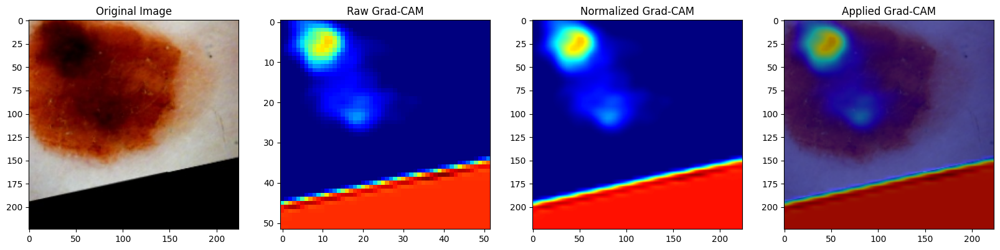

In [ ]:
import matplotlib.pyplot as plt

# Plotting the images
def plot_results(original_img_path, heatmap, colored_heatmap, superimposed_img):
    img = cv2.imread(original_img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colored_heatmap_rgb = cv2.cvtColor(colored_heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Raw Grad-CAM')

    plt.subplot(1, 4, 3)
    plt.imshow(colored_heatmap_rgb)
    plt.title('Normalized Grad-CAM')

    plt.subplot(1, 4, 4)
    plt.imshow(superimposed_img_rgb)
    plt.title('Applied Grad-CAM')
    plt.show()

# Plot results
plot_results(img_path, heatmap, colored_heatmap, superimposed_img)


Selected Train Images:
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_1655.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/train/ISIC_3003137.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/train/ISIC_5521289.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_21061.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_23416.jpg: 0.0
Selected Validation Images:
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/train/ISIC_0244877.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_24100.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_30064.jpg: 0.33793070912361145
1/1 [==================

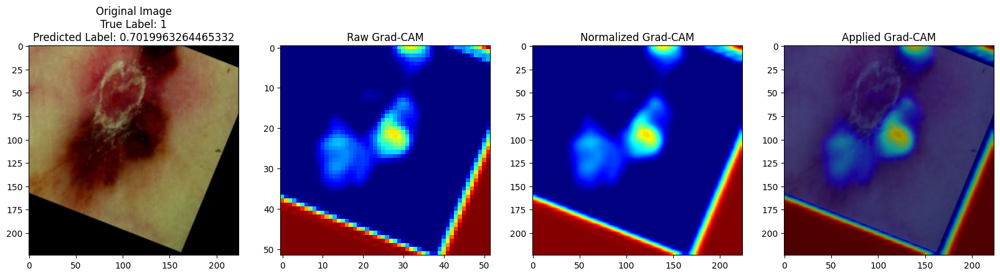

Center intensity for /content/drive/MyDrive/SIIMS Melanoma/augmented images/augmented_images_v2/augmented_image_v2_12990.jpg: 0.0
Center intensity for /content/drive/MyDrive/SIIMS Melanoma/train/ISIC_5632017.jpg: 0.0


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pandas as pd

# Load your saved model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
model = load_model(model_path)

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Rescaling as in training
    return img_array

def get_grad_cam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap

def apply_colormap(heatmap, original_img_path):
    img = cv2.imread(original_img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

def overlay_heatmap_on_image(original_img_path, heatmap_colored, alpha=0.6):
    original_img = cv2.imread(original_img_path)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
    return superimposed_img

def plot_results(original_img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img):
    img = cv2.imread(original_img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colored_heatmap_rgb = cv2.cvtColor(colored_heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title(f'Original Image\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')

    plt.subplot(1, 4, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Raw Grad-CAM')

    plt.subplot(1, 4, 3)
    plt.imshow(colored_heatmap_rgb)
    plt.title('Normalized Grad-CAM')

    plt.subplot(1, 4, 4)
    plt.imshow(superimposed_img_rgb)
    plt.title('Applied Grad-CAM')
    plt.show()

def process_and_visualize(img_path, true_label):
    preprocessed_image = preprocess_image(img_path)
    last_conv_layer_name = 'conv2d_2'  # Last convolutional layer in your model
    heatmap = get_grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Calculate the intensity of the heatmap in the central region
    center_x = heatmap.shape[1] // 2
    center_y = heatmap.shape[0] // 2
    center_intensity = heatmap[center_y, center_x]

    print(f"Center intensity for {img_path}: {center_intensity}")

    # Check if the center intensity is above a certain threshold
    if center_intensity > 0.2:  # Threshold can be adjusted
        colored_heatmap = apply_colormap(heatmap, img_path)
        superimposed_img = overlay_heatmap_on_image(img_path, colored_heatmap)
        predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
        plot_results(img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img)



# Load the CSV files
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Select 5 image paths from each
train_images = train_df.sample(5)
validation_images = validation_df.sample(5)

print("Selected Train Images:")
for idx, row in train_images.iterrows():
    img_path = row['image_path']
    true_label = row['target']
    process_and_visualize(img_path, true_label)

print("Selected Validation Images:")
for idx, row in validation_images.iterrows():
    img_path = row['image_path']
    true_label = row['target']
    process_and_visualize(img_path, true_label)


Selected Train Images:
1/1 [==============================] - 0s 94ms/step


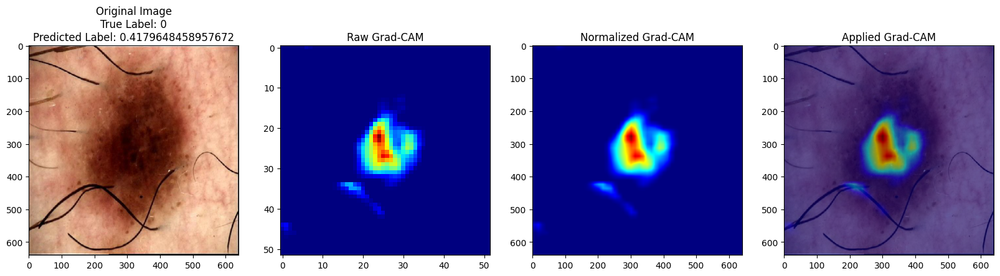

1/1 [==============================] - 0s 39ms/step


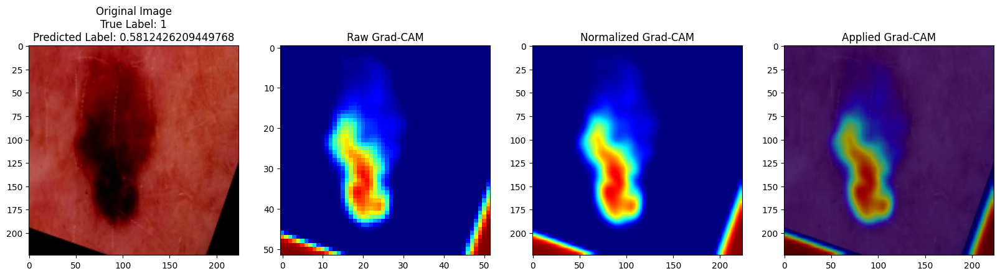

1/1 [==============================] - 0s 38ms/step


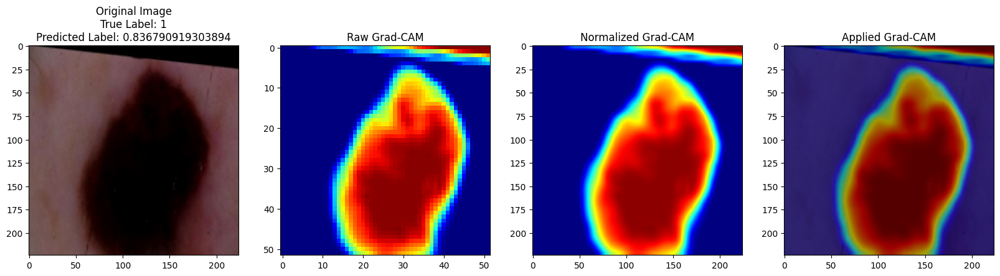

1/1 [==============================] - 0s 37ms/step


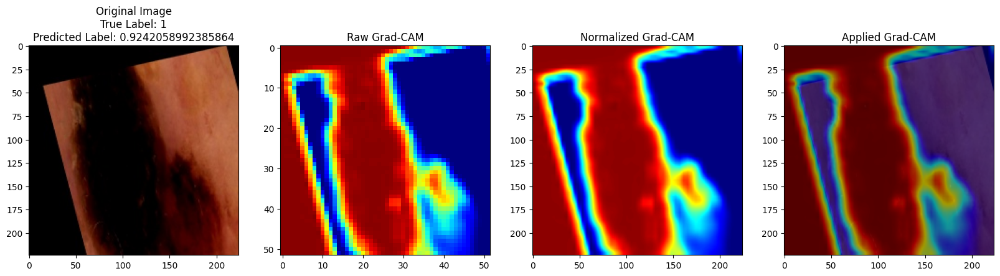

1/1 [==============================] - 0s 120ms/step


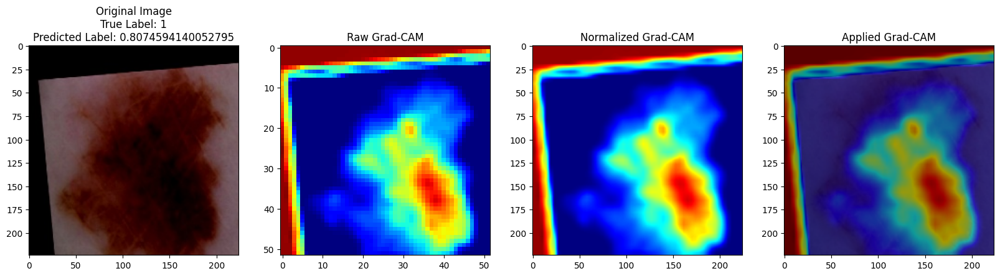

Selected Validation Images:
1/1 [==============================] - 0s 36ms/step


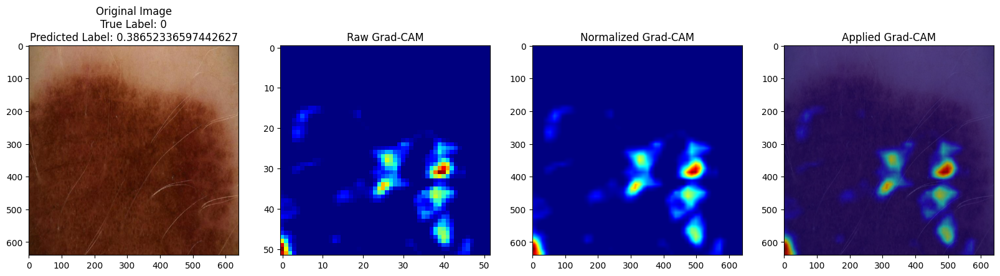

1/1 [==============================] - 0s 61ms/step


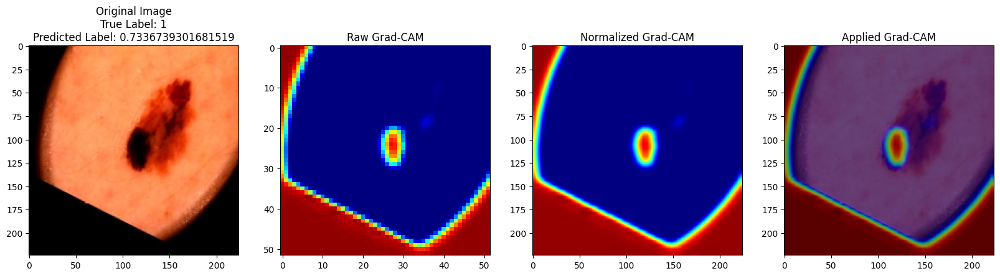

1/1 [==============================] - 0s 63ms/step


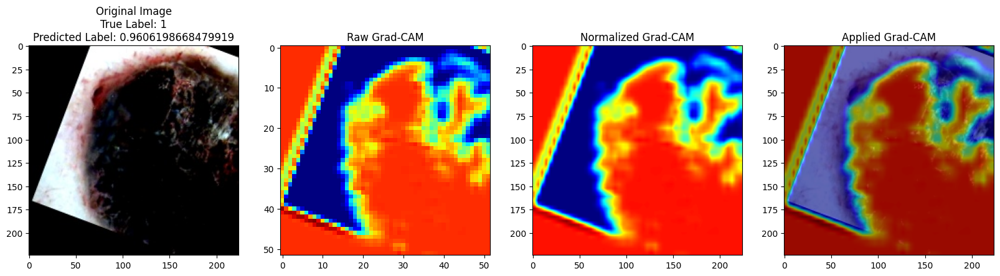

1/1 [==============================] - 0s 40ms/step


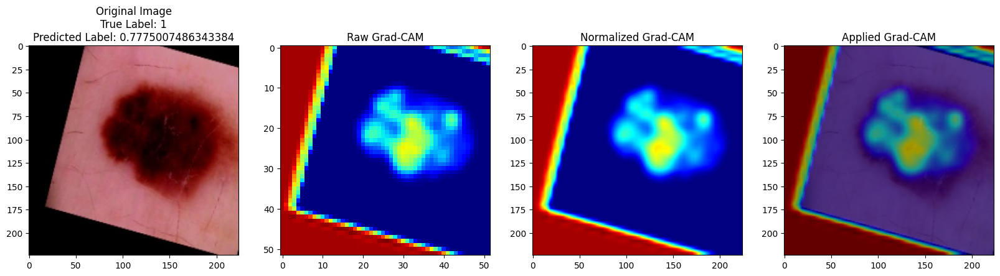

1/1 [==============================] - 0s 39ms/step


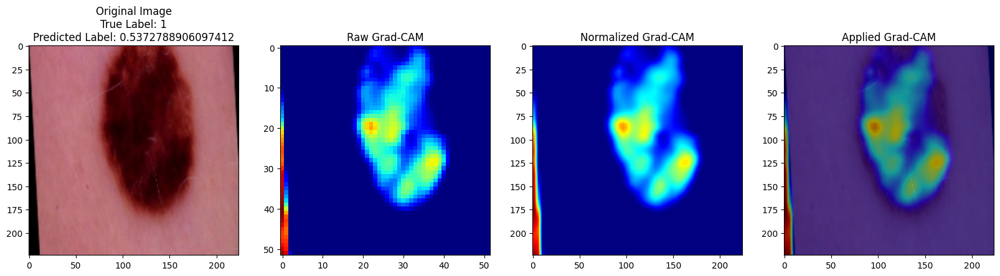

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pandas as pd

# Load your saved model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
model = load_model(model_path)

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Rescaling as in training
    return img_array

def get_grad_cam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap

def apply_colormap(heatmap, original_img_path):
    img = cv2.imread(original_img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

def overlay_heatmap_on_image(original_img_path, heatmap_colored, alpha=0.6):
    original_img = cv2.imread(original_img_path)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
    return superimposed_img

def plot_results(original_img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img):
    img = cv2.imread(original_img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colored_heatmap_rgb = cv2.cvtColor(colored_heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title(f'Original Image\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')

    plt.subplot(1, 4, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Raw Grad-CAM')

    plt.subplot(1, 4, 3)
    plt.imshow(colored_heatmap_rgb)
    plt.title('Normalized Grad-CAM')

    plt.subplot(1, 4, 4)
    plt.imshow(superimposed_img_rgb)
    plt.title('Applied Grad-CAM')
    plt.show()

def process_and_visualize(img_path, true_label):
    preprocessed_image = preprocess_image(img_path)
    last_conv_layer_name = 'conv2d_2'  # Last convolutional layer in your model
    heatmap = get_grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Check if the center intensity is above a certain threshold
    center_intensity = heatmap[heatmap.shape[0] // 2, heatmap.shape[1] // 2]
    if center_intensity > 0.1:  # Adjusted threshold
        colored_heatmap = apply_colormap(heatmap, img_path)
        superimposed_img = overlay_heatmap_on_image(img_path, colored_heatmap)
        predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
        plot_results(img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img)
        return True
    return False

# Load the CSV files
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Process train images
print("Selected Train Images:")
train_images_processed = 0
for idx, row in train_df.iterrows():
    img_path = row['image_path']
    true_label = row['target']
    if process_and_visualize(img_path, true_label):
        train_images_processed += 1
        if train_images_processed >= 5:
            break

# Process validation images
print("Selected Validation Images:")
validation_images_processed = 0
for idx, row in validation_df.iterrows():
    img_path = row['image_path']
    true_label = row['target']
    if process_and_visualize(img_path, true_label):
        validation_images_processed += 1
        if validation_images_processed >= 5:
            break


Train Accuracy: 0.9998214285714285
Validation Accuracy: 0.5082142857142857


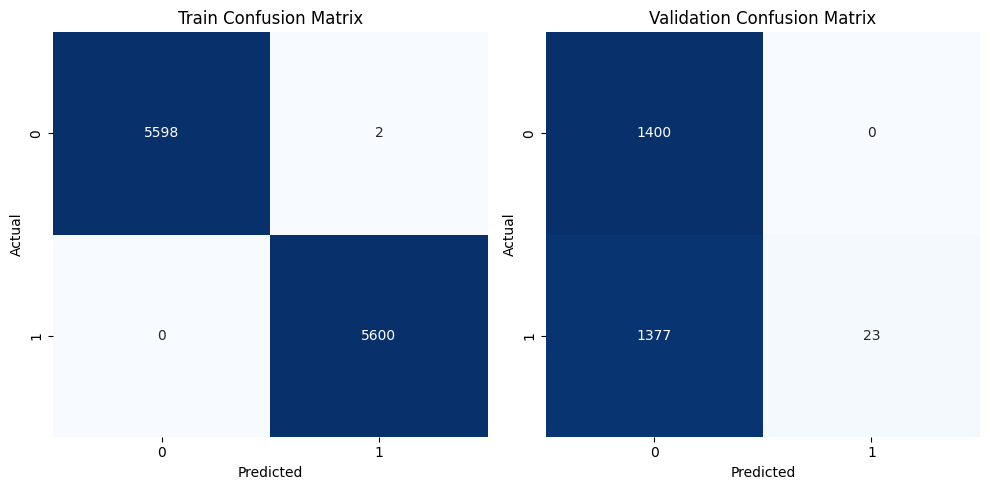

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [16:18:15] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
  warnings.warn(smsg, UserWarning)


In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV files
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Drop irrelevant columns
train_df = train_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
validation_df = validation_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])

# Ensure both datasets have the same diagnosis categories
diagnosis_categories = list(set(train_df['diagnosis'].unique()).union(set(validation_df['diagnosis'].unique())))

# Encode categorical variables
train_df = pd.get_dummies(train_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)
validation_df = pd.get_dummies(validation_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Add missing diagnosis categories to validation data
for category in diagnosis_categories:
    if 'diagnosis_' + category not in validation_df.columns:
        validation_df['diagnosis_' + category] = 0

# Reorder columns to match
validation_df = validation_df[train_df.columns]

# Split features and target
X_train = train_df.drop(columns=['target'])
y_train = train_df['target']
X_val = validation_df.drop(columns=['target'])
y_val = validation_df['target']

# Train XGBoost model
model = xgb.XGBClassifier()
model.fit(X_train, y_train)

# Predictions
y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)

# Accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)
print("Train Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)

# Confusion matrix
train_cm = confusion_matrix(y_train, y_train_pred)
val_cm = confusion_matrix(y_val, y_val_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.heatmap(train_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(val_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.title('Validation Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Save the model
model.save_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")


Train Accuracy: 0.9998214285714285
Validation Accuracy: 0.5082142857142857


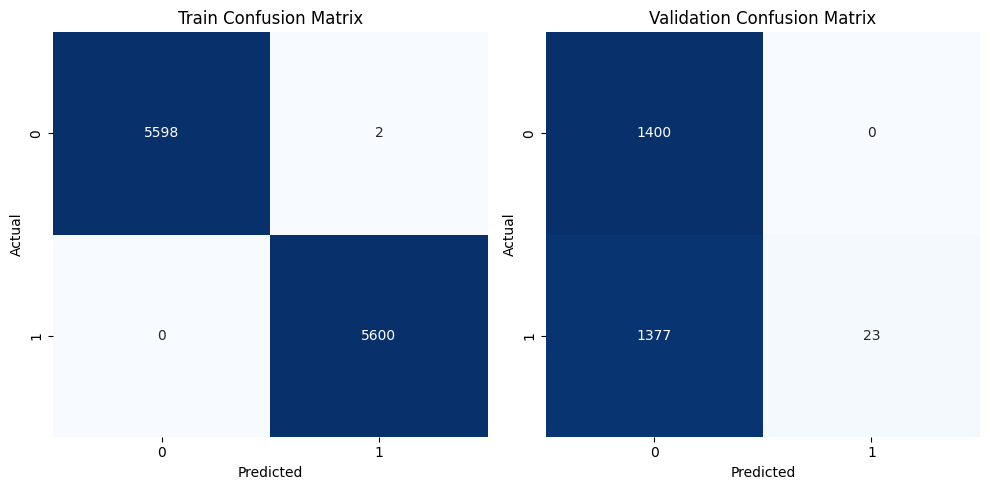

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [16:30:44] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
  warnings.warn(smsg, UserWarning)


In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV files
train_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

train_df = pd.read_csv(train_csv_path)
validation_df = pd.read_csv(validation_csv_path)

# Drop irrelevant columns
train_df = train_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
validation_df = validation_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])

# Ensure both datasets have the same diagnosis categories
diagnosis_categories = list(set(train_df['diagnosis'].unique()).union(set(validation_df['diagnosis'].unique())))

# Encode categorical variables
train_df = pd.get_dummies(train_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)
validation_df = pd.get_dummies(validation_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Add missing diagnosis categories to validation data
for category in diagnosis_categories:
    if 'diagnosis_' + category not in validation_df.columns:
        validation_df['diagnosis_' + category] = 0

# Reorder columns to match
validation_df = validation_df[train_df.columns]

# Split features and target
X_train = train_df.drop(columns=['target'])
y_train = train_df['target']
X_val = validation_df.drop(columns=['target'])
y_val = validation_df['target']

# Define parameter grid for GridSearchCV
param_grid = {
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 5, 10],
    'gamma': [0.1, 0.2, 0.3],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'learning_rate': [0.05, 0.1, 0.2]
}

# Initialize XGBoost classifier
model = xgb.XGBClassifier()

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Train XGBoost model with best parameters
model = xgb.XGBClassifier(**best_params)
model.fit(X_train, y_train)

# Predictions
y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)

# Accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)
print("Train Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)

# Confusion matrix
train_cm = confusion_matrix(y_train, y_train_pred)
val_cm = confusion_matrix(y_val, y_val_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.heatmap(train_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(val_cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.title('Validation Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Save the model
model.save_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")


Model loaded successfully.


  0%|          | 0/80 [00:00<?, ?it/s]

1/1 [==============================] - 0s 468ms/step


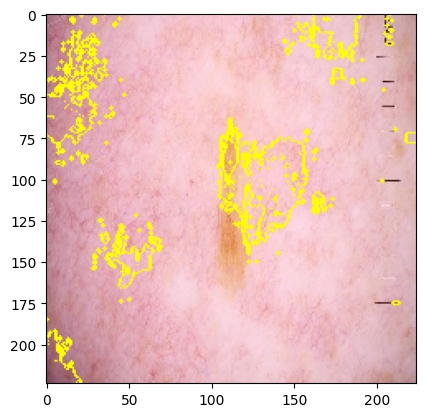

In [ ]:
from tensorflow.keras.models import load_model

# Load the pre-trained image model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
image_model = load_model(model_path)
print("Model loaded successfully.")




import numpy as np
import tensorflow as tf
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Function to preprocess a single image
def preprocess_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

# Initialize LIME Image Explainer
explainer = lime_image.LimeImageExplainer()

# Example image path (replace with your actual image path)
example_image_path = "/content/drive/MyDrive/SIIMS Melanoma/train/ISIC_1730202.jpg"
example_image = preprocess_image(example_image_path)

# Define a prediction function
def predict_fn(images):
    return image_model.predict(images)

# Generate explanation
explanation = explainer.explain_instance(example_image[0].astype('double'), predict_fn, top_labels=1, hide_color=1, num_samples=80)

# Get image and mask
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)

# Display the image with LIME explanation
plt.imshow(mark_boundaries(temp / 255.0, mask))
plt.show()


 99%|===================| 11061/11200 [00:16<00:00]       

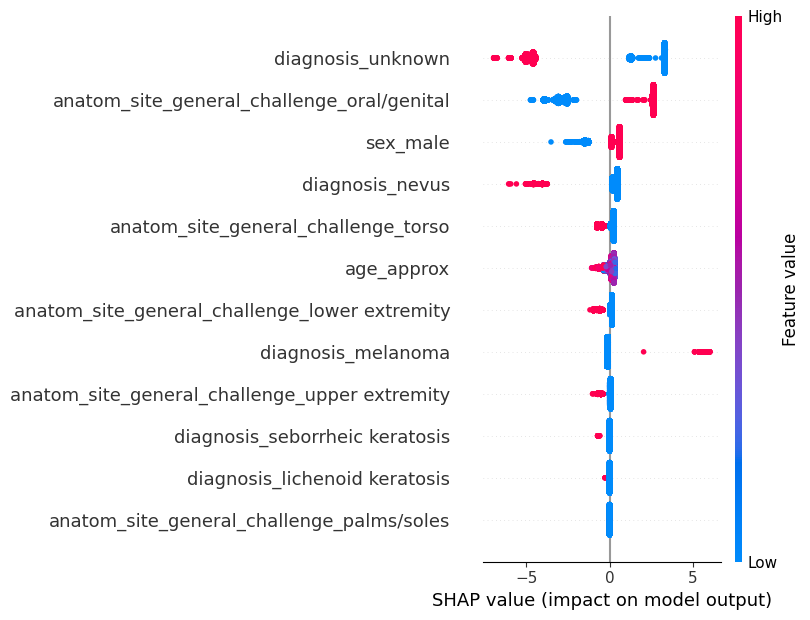

In [ ]:
import shap
import pandas as pd
import numpy as np

# Load the trained meta model
meta_model = xgb.XGBClassifier()
meta_model.load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")

# Load the dataset used for training the meta model
meta_data_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
meta_df = pd.read_csv(meta_data_path)

# Drop irrelevant columns and preprocess data
meta_df = meta_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
meta_df = pd.get_dummies(meta_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Extract features and target
X_meta = meta_df.drop(columns=['target'])
y_meta = meta_df['target']

# Ensure all features are of numerical data type
X_meta = X_meta.astype(float)

# Initialize the SHAP explainer
explainer = shap.Explainer(meta_model, X_meta)

# Generate SHAP values
shap_values = explainer.shap_values(X_meta)

# Visualize the SHAP values
shap.summary_plot(shap_values, X_meta)


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=6a2f5f06b980dd509a3b40fd2ecad2f8e26a34b7ed3fa9e2ac0cf5c18d9340d3
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


 95%|=================== | 10618/11200 [00:12<00:00]       

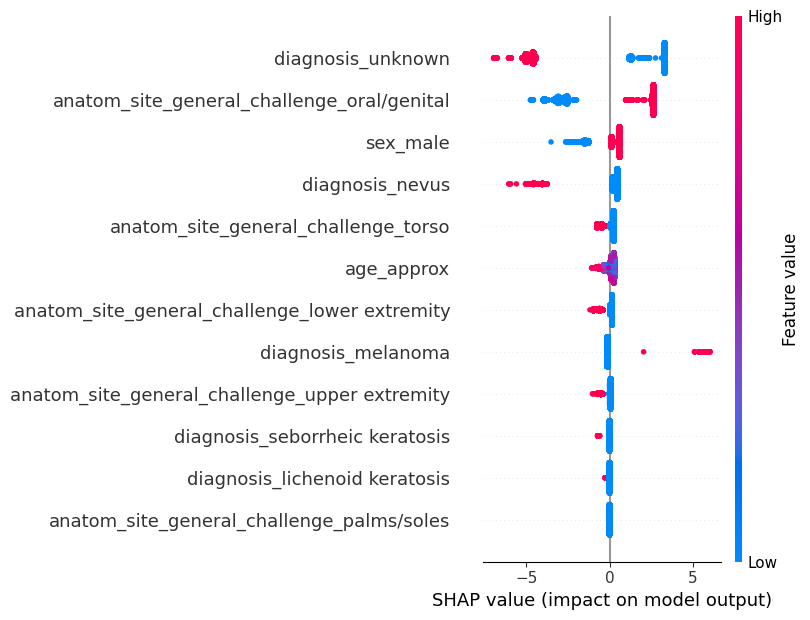

SHAP Summary:


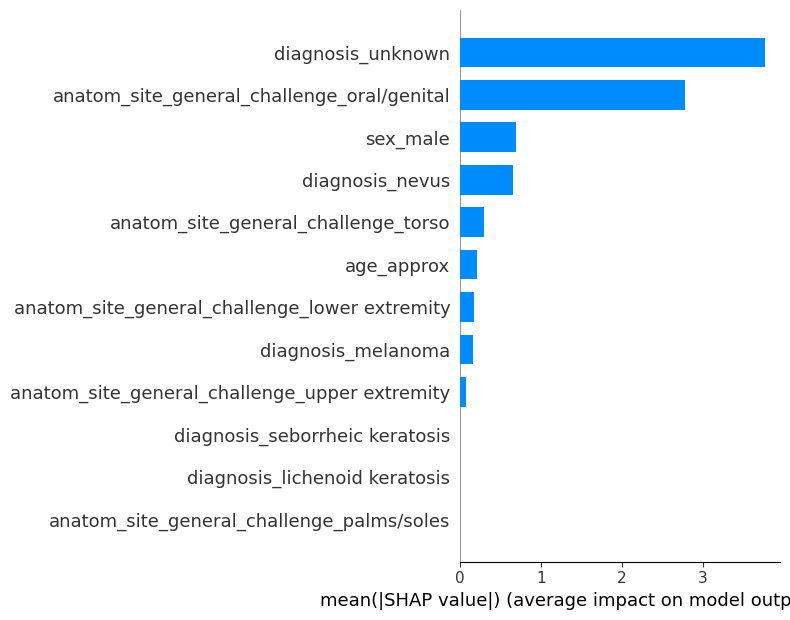

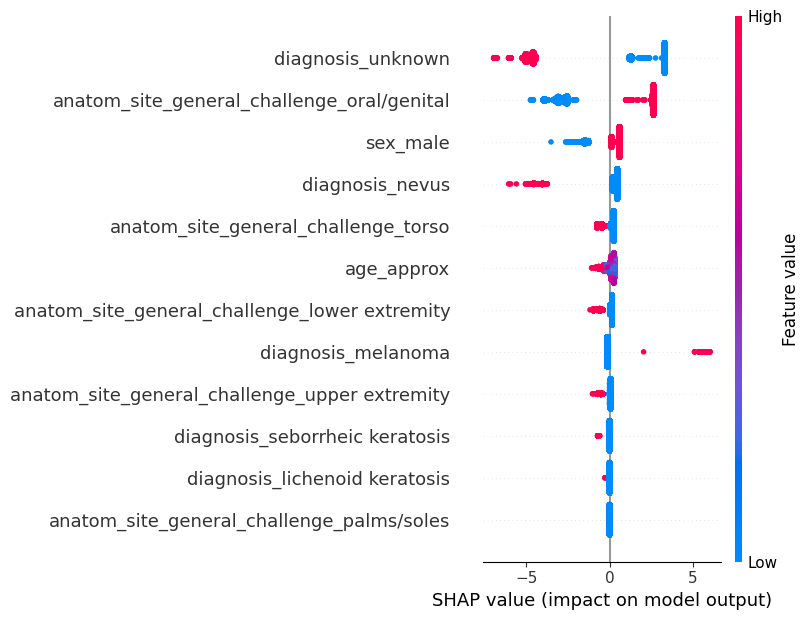

In [ ]:
import shap
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the trained meta model
meta_model = xgb.XGBClassifier()
meta_model.load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")

# Load the dataset used for training the meta model
meta_data_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
meta_df = pd.read_csv(meta_data_path)

# Drop irrelevant columns and preprocess data
meta_df = meta_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
meta_df = pd.get_dummies(meta_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Extract features and target
X_meta = meta_df.drop(columns=['target'])
y_meta = meta_df['target']

# Ensure all features are of numerical data type
X_meta = X_meta.astype(float)

# Initialize the SHAP explainer
explainer = shap.Explainer(meta_model, X_meta)

# Generate SHAP values
shap_values = explainer.shap_values(X_meta)

# Visualize the SHAP values
shap.summary_plot(shap_values, X_meta)

# Print summary
print("SHAP Summary:")
shap.summary_plot(shap_values, X_meta, plot_type='bar')

# Save summary plot
shap.summary_plot(shap_values, X_meta, show=False)
plt.savefig('/content/drive/MyDrive/SIIMS Melanoma/shap_summary_plot.png', bbox_inches='tight')



In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 2.3 MB/s eta 0:00:00


 96%|=================== | 10738/11200 [00:22<00:00]       

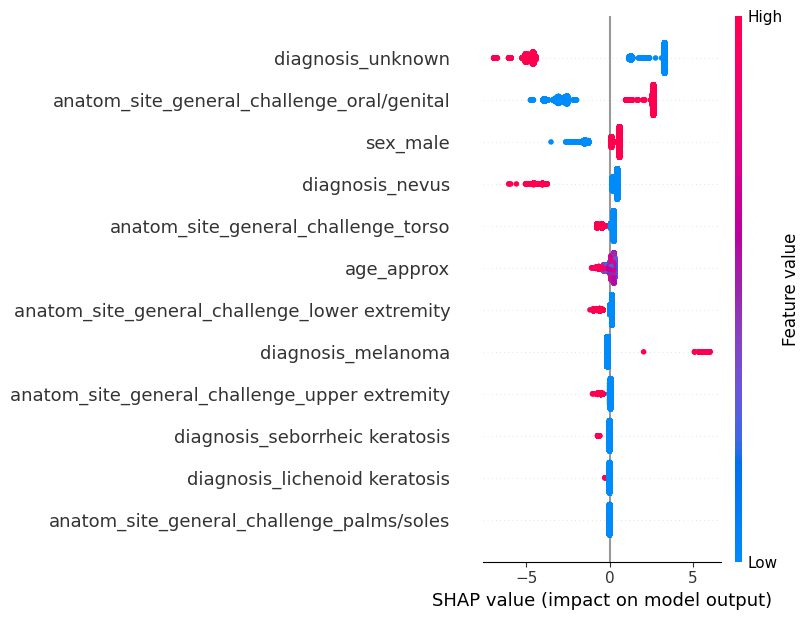

SHAP Summary:


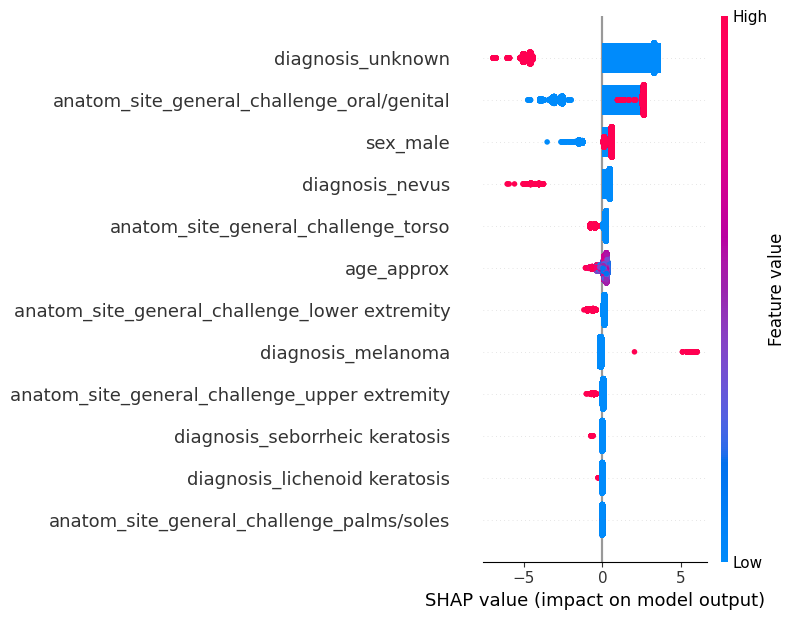

In [ ]:
import shap
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the trained meta model
meta_model = xgb.XGBClassifier()
meta_model.load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")

# Load the dataset used for training the meta model
meta_data_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
meta_df = pd.read_csv(meta_data_path)

# Drop irrelevant columns and preprocess data
meta_df = meta_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
meta_df = pd.get_dummies(meta_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Extract features and target
X_meta = meta_df.drop(columns=['target'])
y_meta = meta_df['target']

# Ensure all features are of numerical data type
X_meta = X_meta.astype(float)

# Initialize the SHAP explainer
explainer = shap.Explainer(meta_model, X_meta)

# Generate SHAP values
shap_values = explainer.shap_values(X_meta)

# Visualize the SHAP values
plt.figure(figsize=(15, 10))  # Adjust size of the plot
shap.summary_plot(shap_values, X_meta)

# Print summary
print("SHAP Summary:")
shap.summary_plot(shap_values, X_meta, plot_type='bar', show=False)

# Save summary plot
shap.summary_plot(shap_values, X_meta, show=False)
plt.savefig('/content/drive/MyDrive/SIIMS Melanoma/shap_summary_plot.png', bbox_inches='tight', dpi=300)  # Save with higher resolution

plt.show()  # Display the plot


 97%|=================== | 10827/11200 [00:22<00:00]       

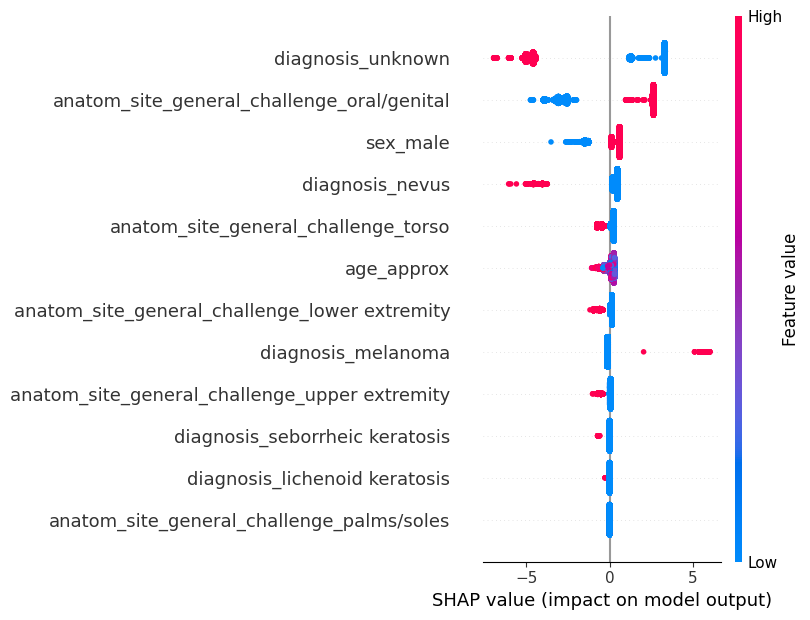

SHAP Summary:


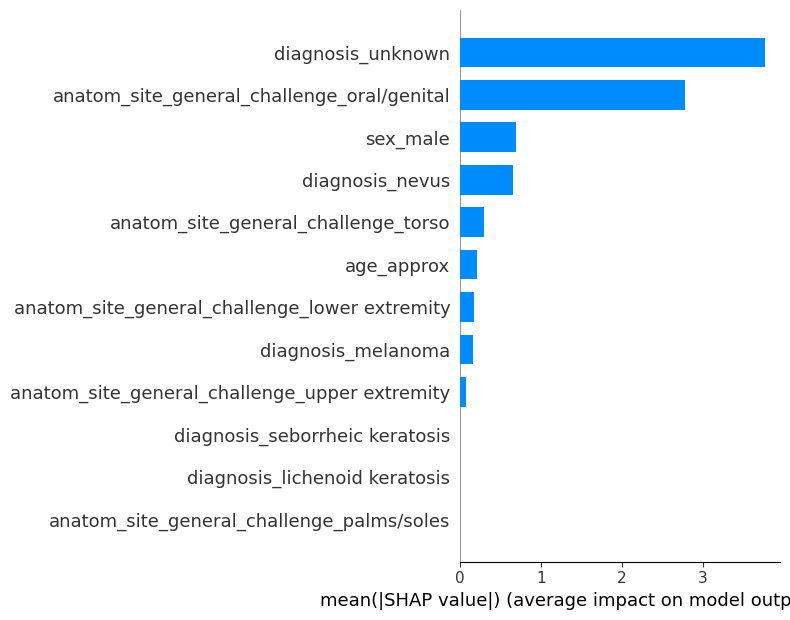

In [ ]:
import shap
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the trained meta model
meta_model = xgb.XGBClassifier()
meta_model.load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")

# Load the dataset used for training the meta model
meta_data_path = "/content/drive/MyDrive/SIIMS Melanoma/train_drive.csv"
meta_df = pd.read_csv(meta_data_path)

# Drop irrelevant columns and preprocess data
meta_df = meta_df.drop(columns=['image_name', 'patient_id', 'image_path', 'benign_malignant'])
meta_df = pd.get_dummies(meta_df, columns=['sex', 'anatom_site_general_challenge', 'diagnosis'], drop_first=True)

# Extract features and target
X_meta = meta_df.drop(columns=['target'])
y_meta = meta_df['target']

# Ensure all features are of numerical data type
X_meta = X_meta.astype(float)

# Initialize the SHAP explainer
explainer = shap.Explainer(meta_model, X_meta)

# Generate SHAP values
shap_values = explainer.shap_values(X_meta)

# Visualize the SHAP values
shap.summary_plot(shap_values, X_meta)

# Print summary
print("SHAP Summary:")
shap.summary_plot(shap_values, X_meta, plot_type='bar', show=False)
plt.show()


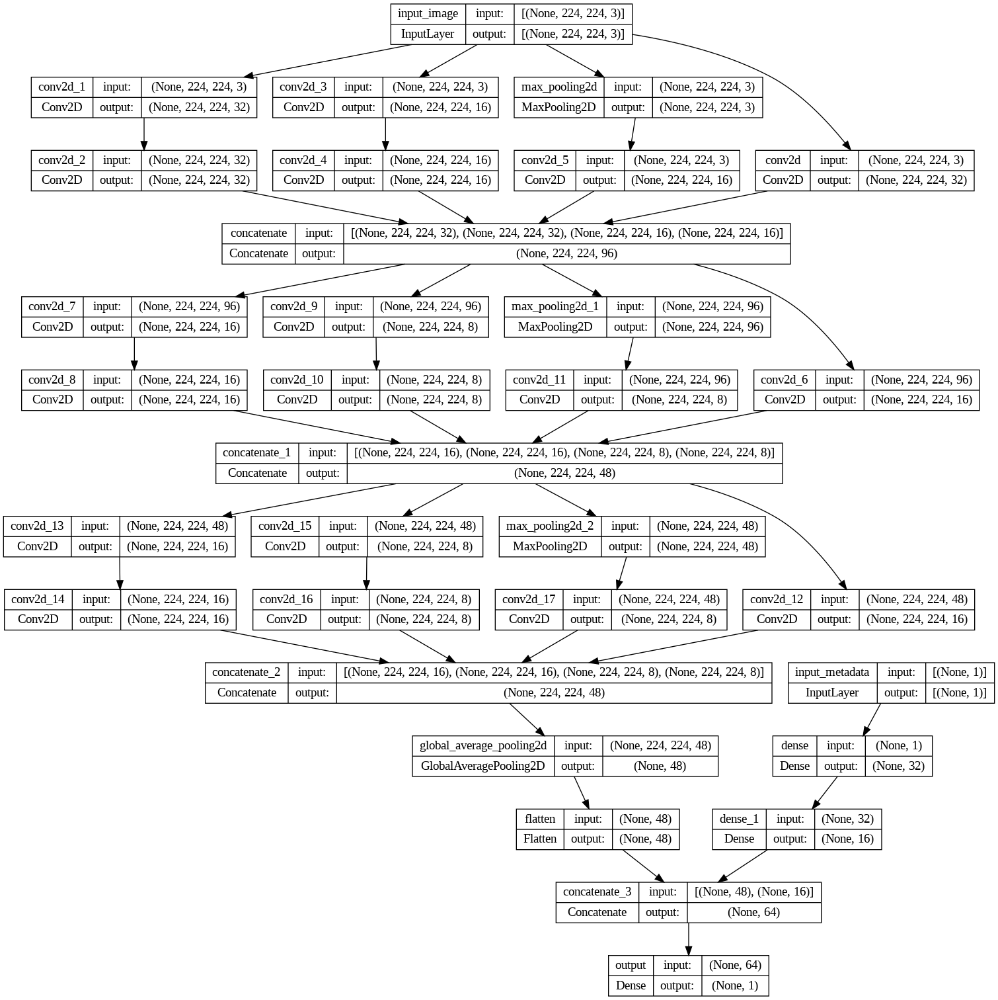

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Define model architecture
inp_image = tf.keras.Input(shape=(224, 224, 3), name='input_image')
inp_metadata = tf.keras.Input(shape=(1,), name='input_metadata')

# Define Inception-like block
def inception_block(x, base_channels=16):
    conv_1 = tf.keras.layers.Conv2D(base_channels * 2, 1, 1, activation='relu')(x)
    conv_2_a = tf.keras.layers.Conv2D(base_channels * 2, 1, 1, activation='relu')(x)
    conv_2_b = tf.keras.layers.Conv2D(base_channels * 2, 3, 1, padding='same', activation='relu')(conv_2_a)
    conv_3_a = tf.keras.layers.Conv2D(base_channels, 1, 1, activation='relu')(x)
    conv_3_b = tf.keras.layers.Conv2D(base_channels, 5, 1, padding='same', activation='relu')(conv_3_a)
    mpool_4_a = tf.keras.layers.MaxPooling2D(3, 1, padding='same')(x)
    conv_4_b = tf.keras.layers.Conv2D(base_channels, 1, 1, activation='relu')(mpool_4_a)
    return tf.keras.layers.Concatenate(axis=-1)([conv_1, conv_2_b, conv_3_b, conv_4_b])

block_1 = inception_block(inp_image)
block_2 = inception_block(block_1, base_channels=8)
block_3 = inception_block(block_2, base_channels=8)

gap = tf.keras.layers.GlobalAveragePooling2D()(block_3)
flatn = tf.keras.layers.Flatten()(gap)

metadata_dense = tf.keras.layers.Dense(32, activation='relu')(inp_metadata)
metadata_output = tf.keras.layers.Dense(16, activation='relu')(metadata_dense)

concat = tf.keras.layers.Concatenate(axis=-1)([flatn, metadata_output])
output = tf.keras.layers.Dense(1, activation="sigmoid", name='output')(concat)

model = tf.keras.Model(inputs=[inp_image, inp_metadata], outputs=output)

# Plot the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


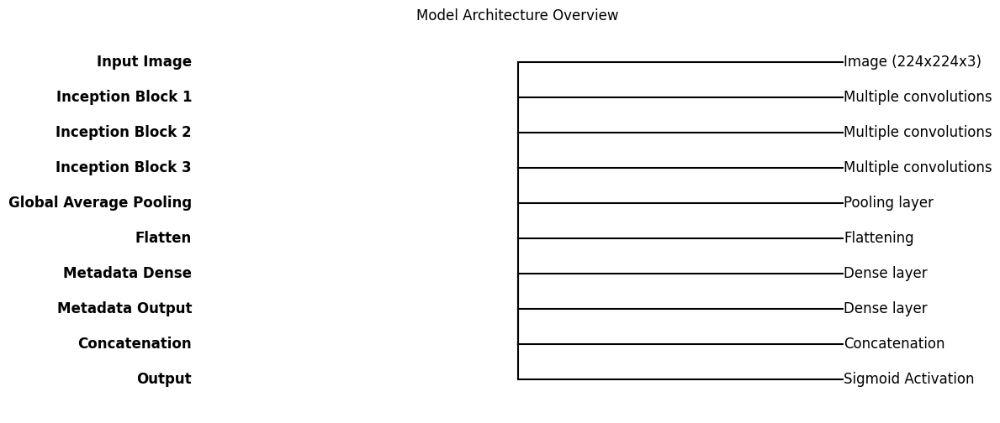

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the model architecture using blocks
blocks = {
    "Input Image": "Image (224x224x3)",
    "Inception Block 1": "Multiple convolutions",
    "Inception Block 2": "Multiple convolutions",
    "Inception Block 3": "Multiple convolutions",
    "Global Average Pooling": "Pooling layer",
    "Flatten": "Flattening",
    "Metadata Dense": "Dense layer",
    "Metadata Output": "Dense layer",
    "Concatenation": "Concatenation",
    "Output": "Sigmoid Activation"
}

# Define connections between blocks
connections = [
    ("Input Image", "Inception Block 1"),
    ("Inception Block 1", "Inception Block 2"),
    ("Inception Block 2", "Inception Block 3"),
    ("Inception Block 3", "Global Average Pooling"),
    ("Global Average Pooling", "Flatten"),
    ("Metadata Dense", "Metadata Output"),
    ("Flatten", "Concatenation"),
    ("Metadata Output", "Concatenation"),
    ("Concatenation", "Output")
]

# Plot the model
plt.figure(figsize=(10, 6))
for block, description in blocks.items():
    plt.text(0, len(blocks) - list(blocks.keys()).index(block), block, ha='right', va='center', fontsize=12, fontweight='bold')
    plt.text(1, len(blocks) - list(blocks.keys()).index(block), description, ha='left', va='center', fontsize=12)
    plt.plot([0.5, 1], [len(blocks) - list(blocks.keys()).index(block)] * 2, color='black')

for connection in connections:
    plt.plot([0.5, 0.5], [len(blocks) - list(blocks.keys()).index(connection[0]), len(blocks) - list(blocks.keys()).index(connection[1])], color='black')

plt.xlim(0, 1)
plt.ylim(0, len(blocks) + 1)
plt.axis('off')
plt.title("Model Architecture Overview")
plt.show()


<Figure size 3000x2000 with 0 Axes>

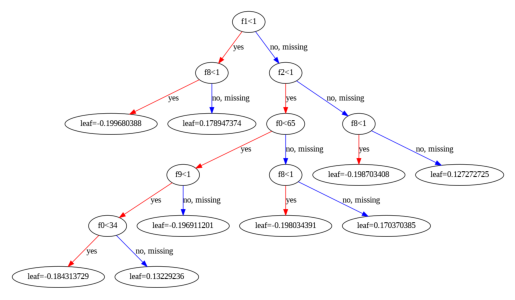

In [ ]:
import xgboost as xgb
from xgboost import plot_tree
import matplotlib.pyplot as plt

# Load the saved model
model = xgb.Booster()
model.load_model("/content/drive/MyDrive/SIIMS Melanoma/exp_model_metadata")

# Plot the tree
plt.figure(figsize=(30, 20))
plot_tree(model, num_trees=0)
plt.show()


4/4 [==============================] - 0s 52ms/step
Sample Predictions and True Labels:
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 0.0
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 0.0
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 1.0
Prediction: 1.0, True Label: 0.0
Prediction: 1.0, True Label: 0.0
Confusion Matrix:
[[ 0 45]
 [ 0 55]]


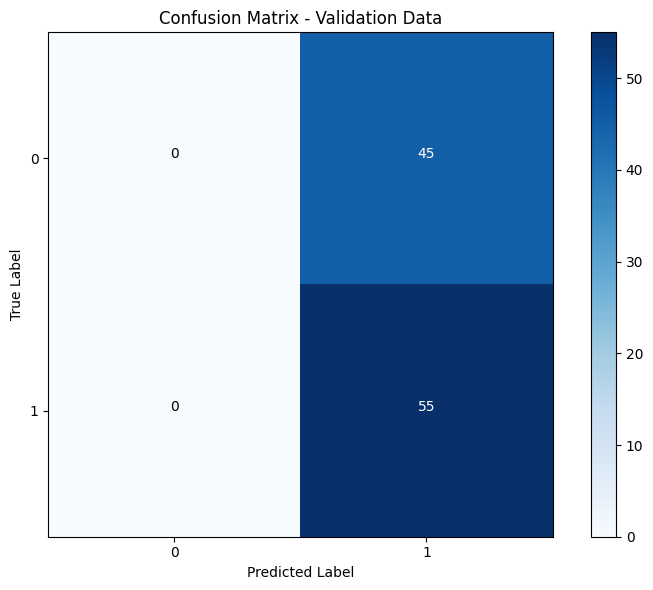

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# Define paths
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"

# Load validation data
validation_df = pd.read_csv(validation_csv_path)

# Take only 100 samples from the validation set
validation_df_sample = validation_df.sample(n=100, random_state=42)

# Extract metadata and labels
metadata_features = ['sex', 'age_approx', 'anatom_site_general_challenge', 'diagnosis']
validation_metadata = validation_df_sample[metadata_features]

# Convert categorical features to numerical
validation_metadata.loc[:, 'sex'] = validation_metadata['sex'].map({'male': 0, 'female': 1})
validation_metadata = pd.get_dummies(validation_metadata, columns=['anatom_site_general_challenge', 'diagnosis'])

# Align columns in validation sets (handle missing columns after get_dummies)
expected_columns = ['sex', 'age_approx', 'anatom_site_general_challenge_back', 'anatom_site_general_challenge_lower extremity',
                    'anatom_site_general_challenge_oral/genital', 'anatom_site_general_challenge_palms/soles',
                    'anatom_site_general_challenge_torso', 'anatom_site_general_challenge_upper extremity',
                    'diagnosis_akiec', 'diagnosis_bcc', 'diagnosis_bkl', 'diagnosis_df',
                    'diagnosis_melanoma', 'diagnosis_nv', 'diagnosis_vasc']

for column in expected_columns:
    if column not in validation_metadata.columns:
        validation_metadata[column] = 0

validation_metadata = validation_metadata[expected_columns]

# Convert metadata to float32
validation_metadata = validation_metadata.astype(np.float32)

# Convert labels to float32
validation_labels = validation_df_sample['target'].astype(np.float32).values

# Load the saved model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model.keras"
model = tf.keras.models.load_model(model_path)

# Preprocess validation images
validation_images = []
for img_path in validation_df_sample['image_path']:
    img = Image.open(img_path)
    img = img.resize((224, 224))
    img_array = img_to_array(img) / 255.0  # Ensure the same normalization as during training
    validation_images.append(img_array)

validation_images = np.array(validation_images)

# Make predictions on validation data
validation_predictions = model.predict([validation_images, validation_metadata])
validation_predictions = np.round(validation_predictions).flatten()

# Print sample predictions and true labels
print("Sample Predictions and True Labels:")
for pred, true in zip(validation_predictions[:10], validation_labels[:10]):
    print(f"Prediction: {pred}, True Label: {true}")

# Calculate the confusion matrix
cm = confusion_matrix(validation_labels, validation_predictions)

# Print confusion matrix
print("Confusion Matrix:")
print(cm)

# Plot the confusion matrix using Matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Validation Data')
plt.colorbar()

# Add labels to the plot
tick_marks = np.arange(len(cm))
plt.xticks(tick_marks, tick_marks)
plt.yticks(tick_marks, tick_marks)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add text annotations
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()


In [ ]:
pip install seaborn


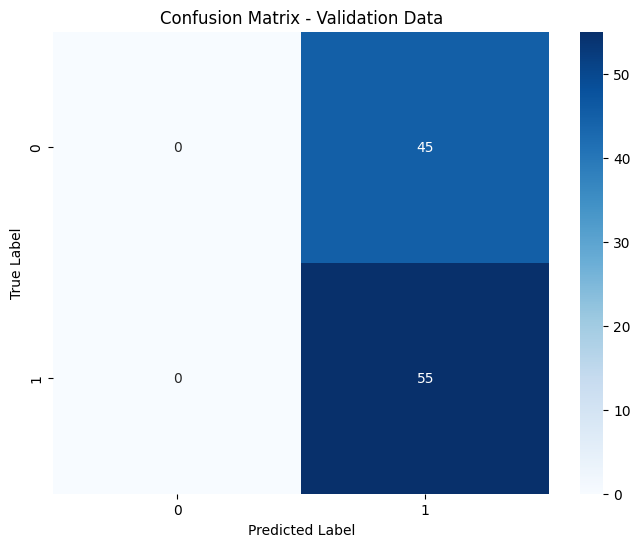

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(validation_labels, validation_predictions)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

plt.title('Confusion Matrix - Validation Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


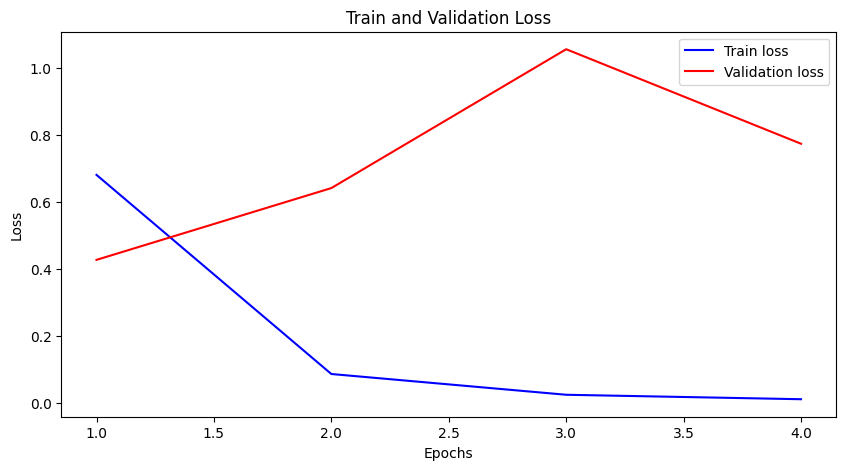

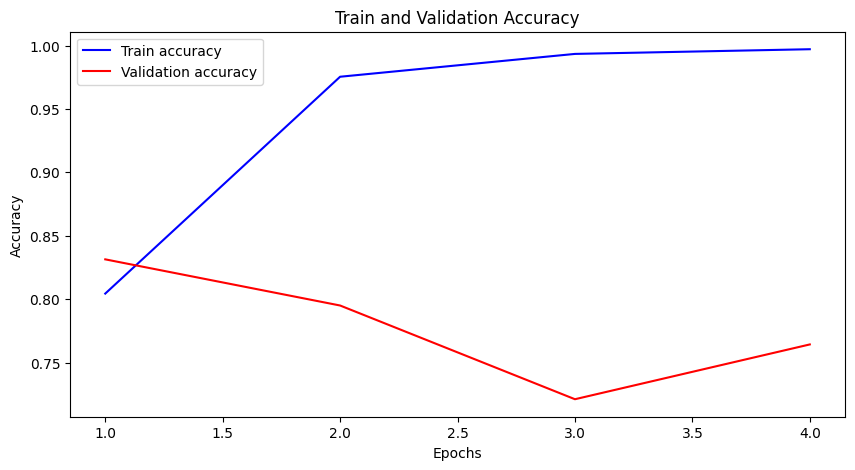

In [ ]:
import matplotlib.pyplot as plt

# Define the metrics per epoch
train_loss = [0.6814, 0.0867, 0.0247, 0.0114]
train_accuracy = [0.8044, 0.9754, 0.9934, 0.9971]
val_loss = [0.4276, 0.6420, 1.0567, 0.7744]
val_accuracy = [0.8314, 0.7950, 0.7211, 0.7643]
epochs = range(1, len(train_loss) + 1)

# Plot the train and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'b', label='Train loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the train and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'b', label='Train accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Train and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


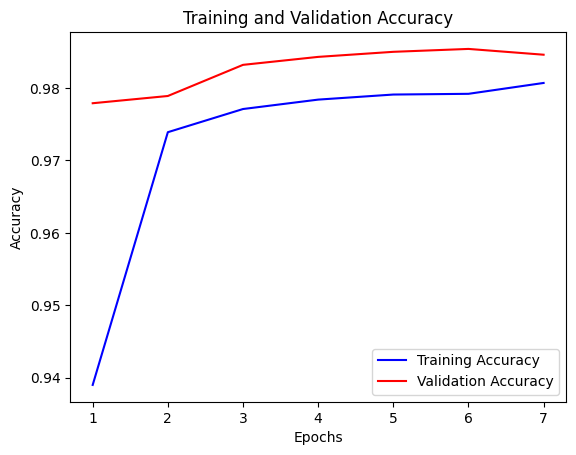

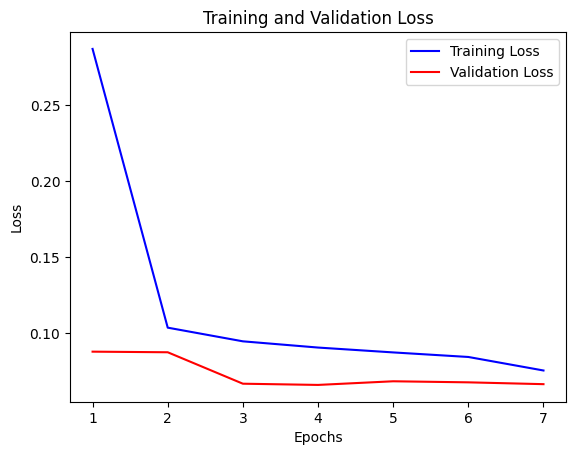

In [ ]:
import matplotlib.pyplot as plt

history_image = {
    'train_accuracy': [0.9390, 0.9739, 0.9771, 0.9784, 0.9791, 0.9792, 0.9807],
    'val_accuracy': [0.9779, 0.9789, 0.9832, 0.9843, 0.9850, 0.9854, 0.9846],
    'loss': [0.2872, 0.1037, 0.0947, 0.0906, 0.0874, 0.0844, 0.0755],
    'val_loss': [0.0879, 0.0875, 0.0668, 0.0660, 0.0684, 0.0677, 0.0665],
}

# Extracting metrics
train_accuracy = history_image['train_accuracy']
val_accuracy = history_image['val_accuracy']
loss = history_image['loss']
val_loss = history_image['val_loss']
epochs = range(1, len(train_accuracy) + 1)

# Plotting accuracy
plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotting loss
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 [==============================] - 0s 62ms/step


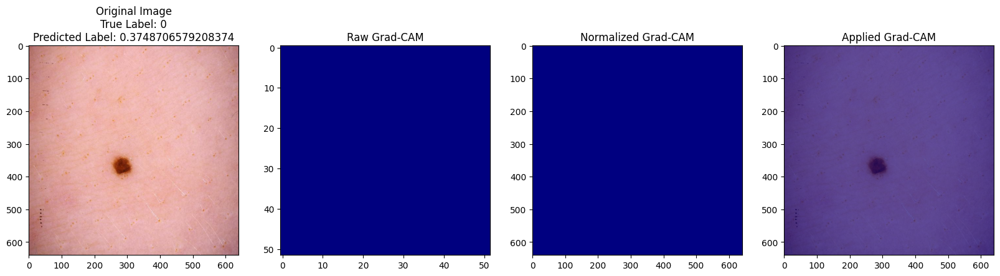

1/1 [==============================] - 0s 36ms/step


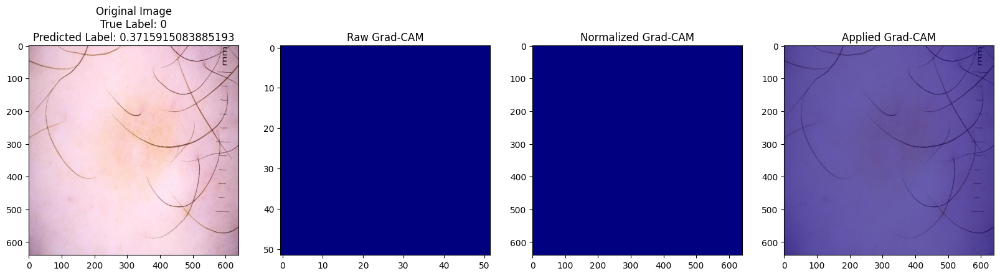

1/1 [==============================] - 0s 30ms/step


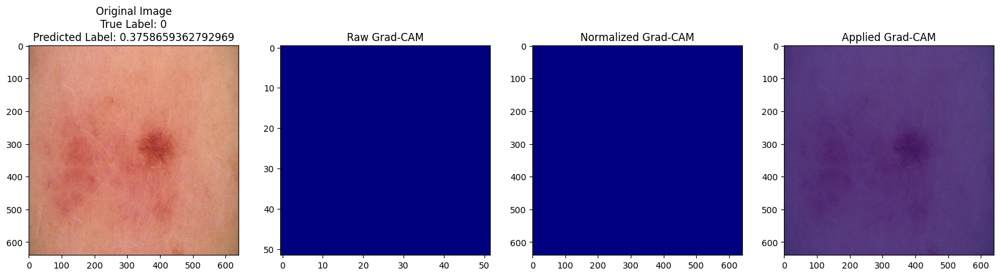

1/1 [==============================] - 0s 37ms/step


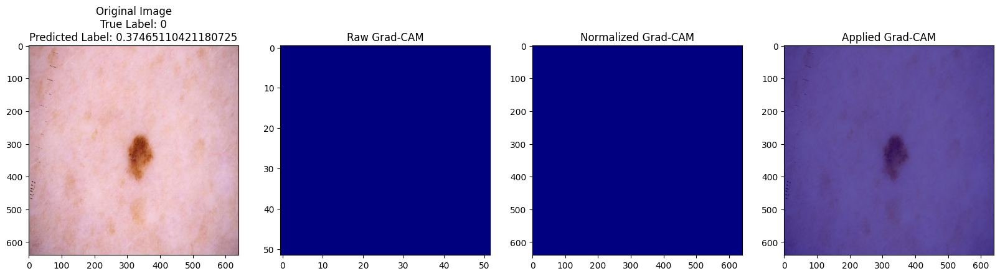

1/1 [==============================] - 0s 18ms/step


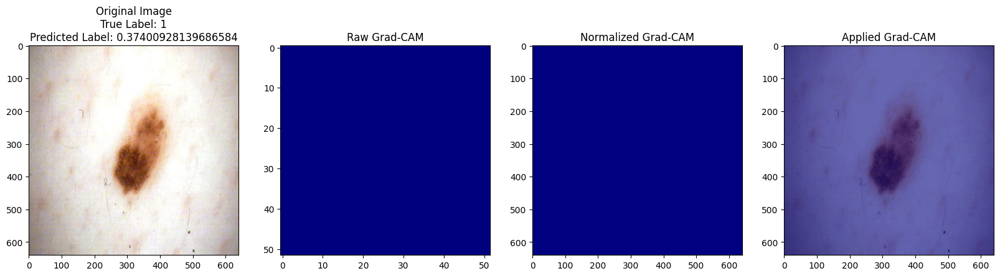

1/1 [==============================] - 0s 19ms/step


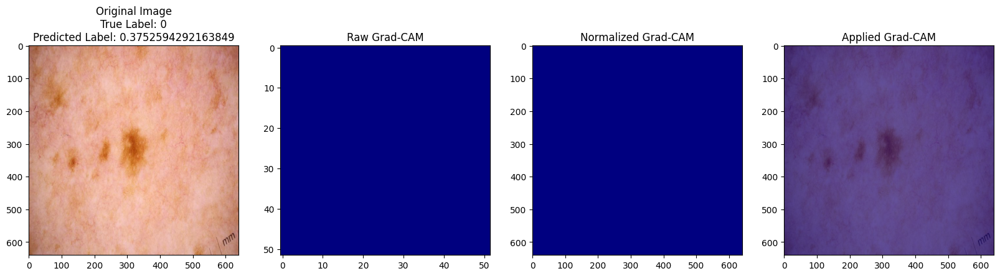

1/1 [==============================] - 0s 22ms/step


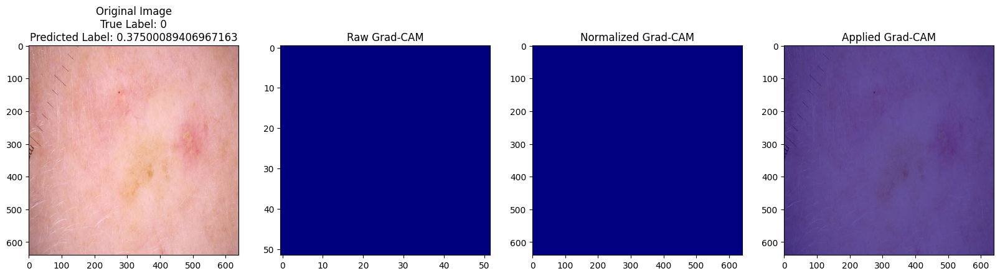

1/1 [==============================] - 0s 20ms/step


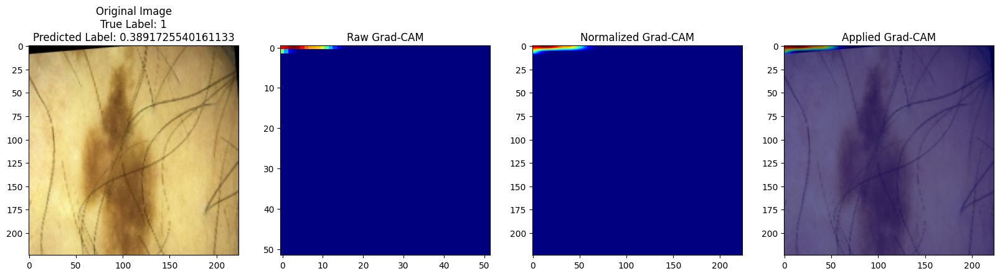

1/1 [==============================] - 0s 33ms/step


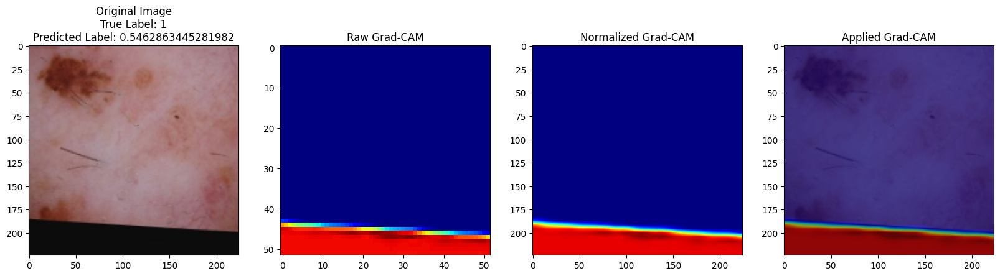

1/1 [==============================] - 0s 45ms/step


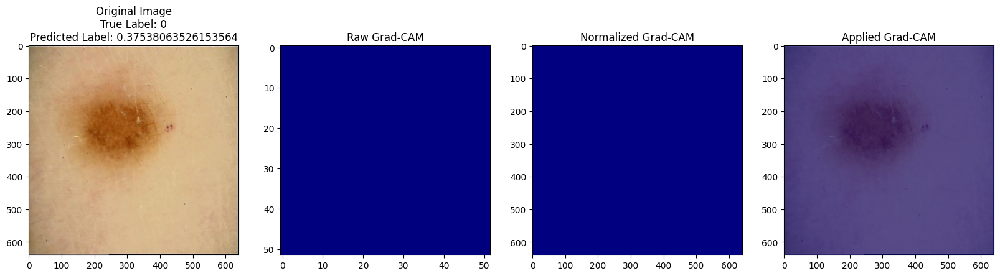

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pandas as pd

# Load your saved model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
model = load_model(model_path)

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Rescaling as in training
    return img_array

def get_grad_cam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap

def apply_colormap(heatmap, original_img_path):
    img = cv2.imread(original_img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

def overlay_heatmap_on_image(original_img_path, heatmap_colored, alpha=0.6):
    original_img = cv2.imread(original_img_path)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
    return superimposed_img

def plot_results(original_img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img):
    img = cv2.imread(original_img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colored_heatmap_rgb = cv2.cvtColor(colored_heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title(f'Original Image\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')

    plt.subplot(1, 4, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Raw Grad-CAM')

    plt.subplot(1, 4, 3)
    plt.imshow(colored_heatmap_rgb)
    plt.title('Normalized Grad-CAM')

    plt.subplot(1, 4, 4)
    plt.imshow(superimposed_img_rgb)
    plt.title('Applied Grad-CAM')
    plt.show()

def process_and_visualize(img_path, true_label):
    preprocessed_image = preprocess_image(img_path)
    last_conv_layer_name = 'conv2d_2'  # Last convolutional layer in your model
    heatmap = get_grad_cam(model, preprocessed_image, last_conv_layer_name)

    colored_heatmap = apply_colormap(heatmap, img_path)
    superimposed_img = overlay_heatmap_on_image(img_path, colored_heatmap)
    predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
    plot_results(img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img)

# Load the CSV file
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"
validation_df = pd.read_csv(validation_csv_path)

# Select misclassified images
misclassified_images_count = 0
for idx, row in validation_df.iterrows():
    if misclassified_images_count >= 10:
        break
    img_path = row['image_path']
    true_label = row['target']
    preprocessed_image = preprocess_image(img_path)
    predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
    if predicted_label != true_label:
        misclassified_images_count += 1
        process_and_visualize(img_path, true_label)


1/1 [==============================] - 0s 62ms/step


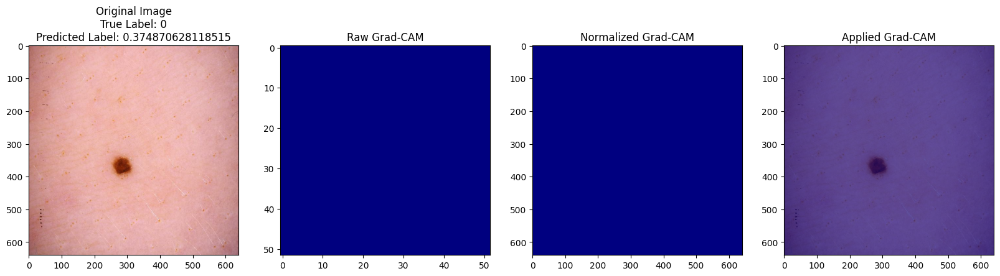

1/1 [==============================] - 0s 100ms/step


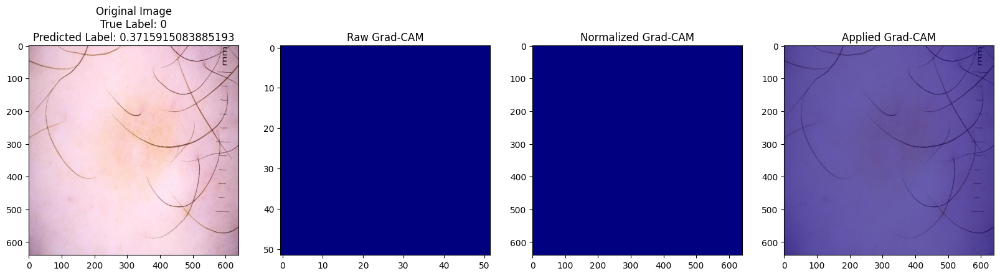

1/1 [==============================] - 0s 77ms/step


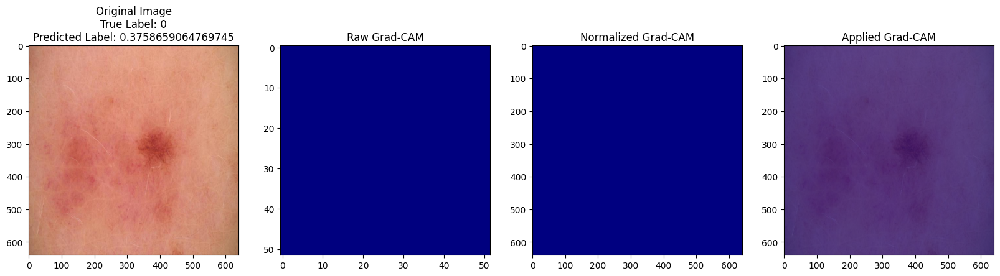

1/1 [==============================] - 0s 68ms/step


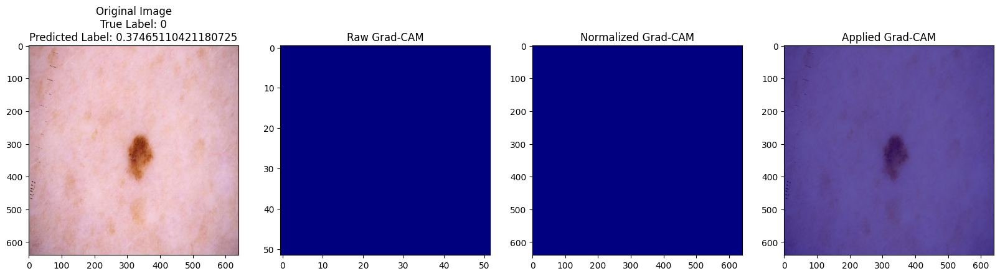

1/1 [==============================] - 0s 70ms/step


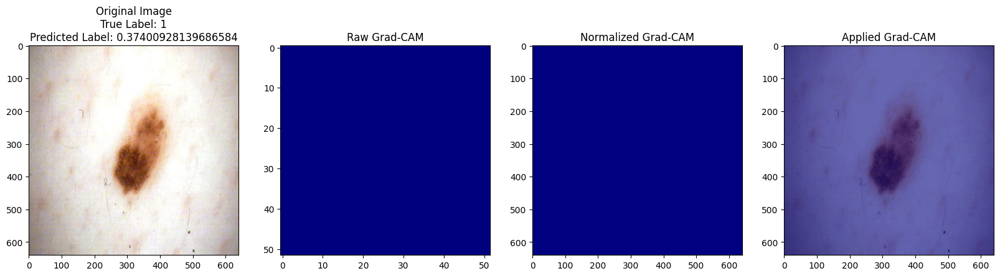

1/1 [==============================] - 0s 67ms/step


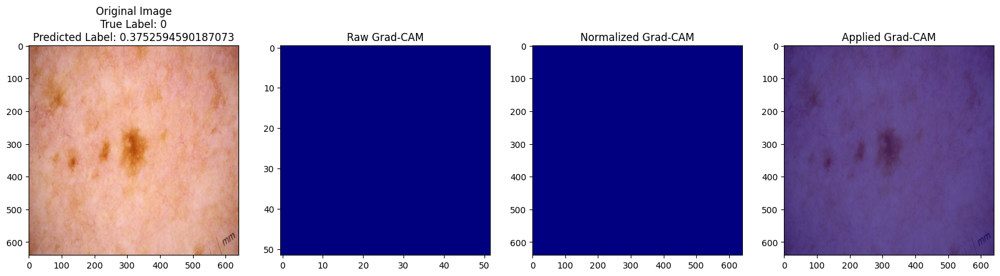

1/1 [==============================] - 0s 42ms/step


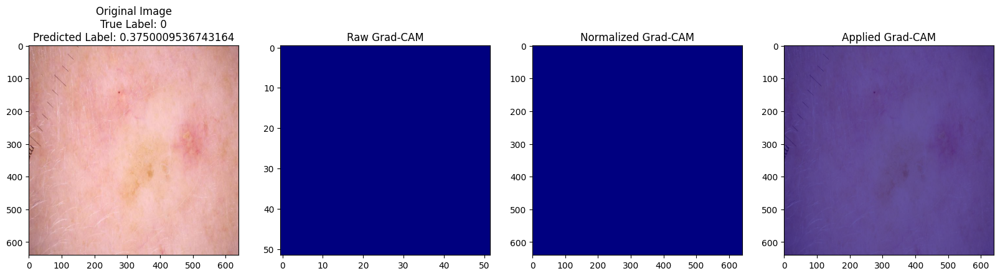

1/1 [==============================] - 0s 59ms/step


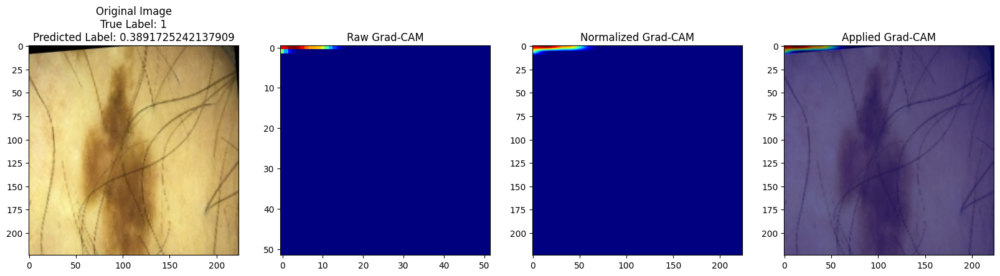

1/1 [==============================] - 0s 54ms/step


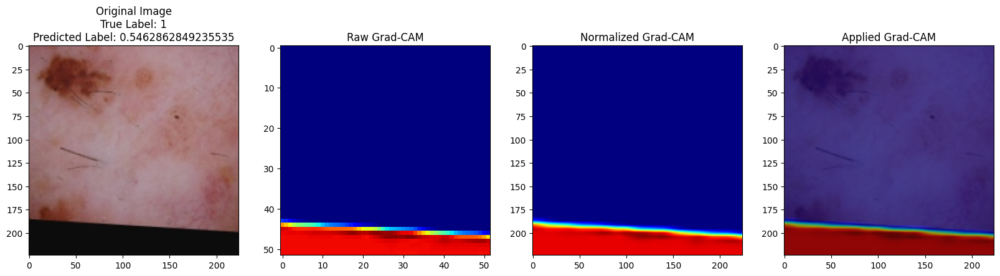

1/1 [==============================] - 0s 43ms/step


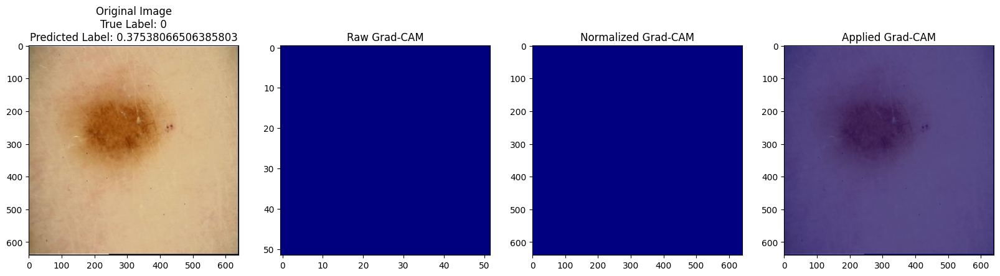

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pandas as pd

# Load your saved model
model_path = "/content/drive/MyDrive/SIIMS Melanoma/exp_model_image.h5"
model = load_model(model_path)

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Rescaling as in training
    return img_array

def get_grad_cam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap

def apply_colormap(heatmap, original_img_path):
    img = cv2.imread(original_img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

def overlay_heatmap_on_image(original_img_path, heatmap_colored, alpha=0.6):
    original_img = cv2.imread(original_img_path)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
    return superimposed_img

def plot_results(original_img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img):
    img = cv2.imread(original_img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    colored_heatmap_rgb = cv2.cvtColor(colored_heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title(f'Original Image\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')

    plt.subplot(1, 4, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Raw Grad-CAM')

    plt.subplot(1, 4, 3)
    plt.imshow(colored_heatmap_rgb)
    plt.title('Normalized Grad-CAM')

    plt.subplot(1, 4, 4)
    plt.imshow(superimposed_img_rgb)
    plt.title('Applied Grad-CAM')
    plt.show()

def process_and_visualize(img_path, true_label):
    preprocessed_image = preprocess_image(img_path)
    last_conv_layer_name = 'conv2d_2'  # Last convolutional layer in your model
    heatmap = get_grad_cam(model, preprocessed_image, last_conv_layer_name)

    colored_heatmap = apply_colormap(heatmap, img_path)
    superimposed_img = overlay_heatmap_on_image(img_path, colored_heatmap)
    predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
    plot_results(img_path, true_label, predicted_label, heatmap, colored_heatmap, superimposed_img)

# Load the CSV file
validation_csv_path = "/content/drive/MyDrive/SIIMS Melanoma/validation_drive.csv"
validation_df = pd.read_csv(validation_csv_path)

# Select misclassified images
misclassified_images_count = 0
for idx, row in validation_df.iterrows():
    if misclassified_images_count >= 10:
        break
    img_path = row['image_path']
    true_label = row['target']
    preprocessed_image = preprocess_image(img_path)
    predicted_label = model.predict(preprocessed_image)[0][0]  # Assuming binary classification
    if predicted_label != true_label:
        misclassified_images_count += 1
        process_and_visualize(img_path, true_label)
